# SBM overlapping
This algorithm works for different types of networks.

We used this command on the directed weighted network:


    
    """
    class graph_tool.inference.OverlapBlockState(g, b=None, 
    B=None, recs=[], rec_types=[], rec_params=[], clabel=None, 
    pclabel=None, deg_corr=True, allow_empty=False, max_BE=1000,
                                            **kwargs)
    """
   state = minimize_blockmodel_dl(g, state_args=dict(recs=[g.ep.weight],rec_types=["discrete-poisson"]))
    
    b = state.get_blocks()
    
    s = OverlapBlockState(g, b=b, recs=[g.ep.weight],rec_types=["discrete-poisson"]) 

In [1]:
import os
from graph_tool.all import *
import codecs
from collections import defaultdict, OrderedDict
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline 
from igraph import *
from scipy.stats.stats import pearsonr
from scipy import stats
import seaborn as sns
import pandas as pd
import math
import json
plt.style.use('seaborn-white')
sns.set(font_scale=2) 
sns.set_style("white")

In [2]:
WORKING_FOLDER = '../../../DATA/FIN/SBM_overlapping'
os.chdir(WORKING_FOLDER)
f_in_graph = 'mention_graph_weights.dat'
# this is a .tree file
f_in_output_comm = 'SBM_overlapping_clusters_node_names_1600_powlaw'

# Read in data

In [3]:
# returns a dict with node ids per community in each value
# dict keys are just community ids in returned order 
def read_output():  
    input_file = codecs.open(f_in_output_comm, 'r', encoding='utf8')
    output = defaultdict(list)
    num_COMM = 0
    for line in input_file:
        line = line.split()
        output[num_COMM] = line
        num_COMM += 1
         
    return output
read_output()

defaultdict(list,
            {0: [u'5660',
              u'21417',
              u'11355',
              u'14988',
              u'14726',
              u'19551',
              u'906',
              u'5809',
              u'13770',
              u'19198',
              u'1867',
              u'10788',
              u'17317',
              u'2309',
              u'7806',
              u'14516',
              u'12948',
              u'28713',
              u'12755',
              u'18651',
              u'9996',
              u'26662',
              u'15215',
              u'23711',
              u'1392',
              u'15138',
              u'27369',
              u'2795',
              u'9208',
              u'794',
              u'2673',
              u'27381',
              u'16927',
              u'22021',
              u'929',
              u'768',
              u'797',
              u'15927',
              u'6751',
              u'8732',
              u'15461',
              u'1

In [4]:
def read_in_top_communities(sizeN):
    ordered_communities = OrderedDict(sorted(read_output().items(), key=lambda t:len(t[1]), reverse=True))
    top_communities = OrderedDict(x for x in ordered_communities.items() if len(x[1])>sizeN)
    return top_communities

In [5]:
# returns a set of communities in which each node belongs to
def find_nodes_COMM():
    nodes_COMM = defaultdict(list)
    output = read_output()
    for comm in output.keys():
        for node in output[comm]:
            nodes_COMM[int(node)].append(comm)
            
    for node in nodes_COMM:
            nodes_COMM[int(node)] = list(set(nodes_COMM[node]))
            
    return nodes_COMM

In [6]:
find_nodes_COMM()

defaultdict(list,
            {0: [139],
             1: [1410, 455, 712, 47, 1203, 436, 1303, 346, 991, 700, 445, 703],
             2: [797],
             3: [640, 1412, 776, 1545, 1266, 318],
             4: [817, 426, 605, 903],
             5: [1265, 1477, 29, 255],
             6: [1264,
              482,
              1384,
              1372,
              1133,
              1166,
              591,
              752,
              849,
              505,
              1231,
              348,
              29],
             7: [865, 1187, 936, 491, 1426, 50, 1463],
             8: [1133, 469, 1365, 493],
             9: [1408, 1417, 1018, 430],
             10: [737,
              578,
              67,
              1062,
              529,
              713,
              714,
              967,
              1519,
              49,
              1363,
              21,
              790,
              1449,
              889,
              538],
             12: [897, 970

In [8]:
# a helper function to show us info when print info is true
# otherwise returns only the list of community sizes
def num_and_sizes_COMM(print_info=False):
    COMM_sizes = []
    ALL_users = defaultdict(int)
    infomap_COMM = read_output()
    num_COMM = len(infomap_COMM.keys())
    for comm in infomap_COMM:
        COMM_sizes.append(len(infomap_COMM[comm]))
        for el in infomap_COMM[comm]:
            ALL_users[el] = 1
    if print_info:
        print 'Infomap has output: %d COMM ' % (num_COMM)
        print 'Their sizes in increasing order:'
        print sorted(COMM_sizes)
        print 'Total number of users in COMM:'
        print len(ALL_users.keys())
        print 'Total size of COMM:'
        print sum(COMM_sizes)
    return COMM_sizes
num_and_sizes_COMM(print_info=True)

Infomap has output: 1600 COMM 
Their sizes in increasing order:
[94, 95, 95, 96, 96, 96, 98, 99, 99, 99, 99, 99, 99, 99, 99, 99, 100, 100, 100, 100, 101, 101, 101, 101, 101, 102, 102, 102, 102, 102, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 105, 105, 105, 105, 105, 105, 105, 105, 105, 105, 105, 105, 105, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 108, 108, 108, 108, 108, 108, 108, 108, 108, 108, 108, 108, 108, 108, 108, 108, 108, 108, 108, 108, 108, 108, 108, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 111, 111, 111, 111, 111, 111, 111, 111, 111, 111, 111, 111, 111, 111, 111, 111, 111, 111, 111, 111, 111, 111, 111, 1

[119,
 127,
 132,
 119,
 152,
 141,
 142,
 134,
 112,
 115,
 133,
 142,
 121,
 127,
 128,
 113,
 119,
 120,
 122,
 126,
 115,
 139,
 114,
 136,
 133,
 113,
 110,
 129,
 121,
 113,
 111,
 118,
 145,
 133,
 109,
 114,
 121,
 120,
 136,
 120,
 118,
 111,
 118,
 120,
 109,
 120,
 114,
 121,
 122,
 124,
 119,
 111,
 131,
 119,
 135,
 134,
 130,
 130,
 103,
 121,
 150,
 123,
 150,
 125,
 141,
 142,
 146,
 125,
 127,
 128,
 125,
 131,
 115,
 122,
 134,
 115,
 136,
 139,
 133,
 119,
 106,
 157,
 142,
 111,
 113,
 127,
 110,
 124,
 125,
 125,
 117,
 120,
 116,
 125,
 133,
 109,
 121,
 99,
 134,
 126,
 121,
 127,
 114,
 122,
 133,
 121,
 113,
 115,
 121,
 119,
 109,
 142,
 120,
 134,
 134,
 120,
 133,
 133,
 134,
 123,
 118,
 108,
 121,
 122,
 119,
 120,
 134,
 157,
 118,
 128,
 108,
 119,
 125,
 114,
 136,
 130,
 109,
 134,
 135,
 112,
 119,
 123,
 114,
 138,
 136,
 134,
 104,
 133,
 114,
 119,
 108,
 121,
 132,
 125,
 115,
 136,
 117,
 141,
 133,
 105,
 119,
 125,
 115,
 130,
 122,
 126,
 127,

In [9]:
# returns the node membership for each node
# i.e., in how many communities it participates
def find_nodes_in_more_COMM():
    nodes_num_COMM = defaultdict(int)
    infomap_COMM = read_output()
    for comm in infomap_COMM:
        for node in infomap_COMM[comm]:
            nodes_num_COMM[int(node)] += 1
    sorted_nodes_num_COMM = OrderedDict(sorted(nodes_num_COMM.items(), key=lambda t:t[1], reverse=True))
    print max(sorted_nodes_num_COMM.values())
    return sorted_nodes_num_COMM

In [10]:
find_nodes_in_more_COMM()

810


OrderedDict([(5660, 810),
             (20181, 361),
             (10152, 216),
             (24833, 215),
             (22458, 196),
             (12982, 188),
             (5881, 184),
             (13208, 182),
             (2309, 152),
             (3384, 134),
             (16191, 124),
             (23597, 116),
             (21417, 114),
             (14516, 111),
             (2022, 106),
             (956, 103),
             (15270, 103),
             (22430, 102),
             (25860, 101),
             (12408, 99),
             (7747, 97),
             (8093, 97),
             (29258, 95),
             (1022, 94),
             (13770, 94),
             (475, 93),
             (20074, 90),
             (21234, 89),
             (11649, 88),
             (6654, 86),
             (6987, 86),
             (13188, 86),
             (17008, 86),
             (18675, 86),
             (22216, 86),
             (15949, 85),
             (26507, 85),
             (1225, 81),
        

# Let us visualize the overalpping community structure

In [150]:
# plots complementary CDF for the membership per node
# in log-log scale
def plot_ccdf_node_comm_membership():
    nodes_num_COMM = find_nodes_in_more_COMM()
    data = np.array(nodes_num_COMM.values())
    sorted_data = np.sort(data)
    yvals=1-np.arange(len(sorted_data))/float(len(sorted_data)-1)
    plt.plot(sorted_data,yvals,color='r')
    plt.yscale('log')
    plt.ylabel('complementary CDF')
    plt.xscale('log')
    plt.xlabel('comm memberships')
    plt.savefig('ccdf_memberships.jpg')
    plt.show()

810


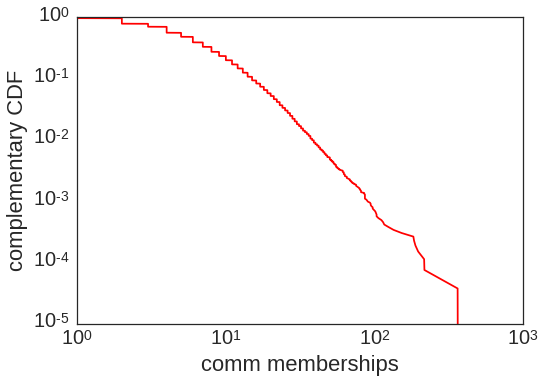

In [151]:
plot_ccdf_node_comm_membership()

In [156]:
# plots complementary CDF for the comm sizes
# in log-log scale
def plot_ccdf_comm_sizes():
    COMM_sizes = num_and_sizes_COMM()
    data = np.array(COMM_sizes)
    sorted_data = np.sort(data)
    yvals=1-np.arange(len(sorted_data))/float(len(sorted_data)-1)
    plt.plot(sorted_data,yvals,color='r', label='SBM overlap')
    plt.yscale('log')
    plt.ylabel('complementary CDF')
    plt.xscale('log')
    plt.xlabel('community size')
    plt.legend()
    plt.savefig('SBM_overlap_ccdf_comm_sizes.jpg')
    plt.show()

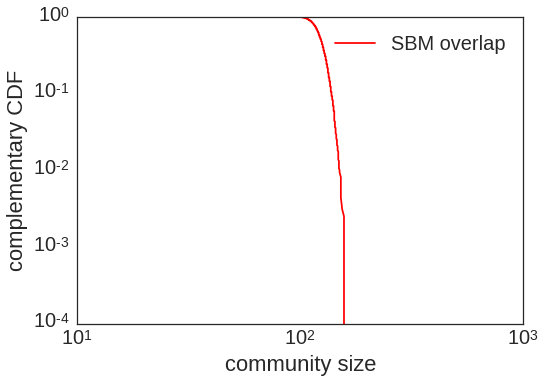

In [157]:
plot_ccdf_comm_sizes()

# Now we add SR values and graph into the story
We want to see does community size correlate with average SR

In [31]:
# reads in the graph using igraph and Ncol format, i.e., edge list
# with weights being the SR on the edges
def read_in_SR_graph():
    #G = Graph.Read_Ncol('undirected_mention_graph_with_SR.csv', directed=False, weights=True)
    #G = read("test", format="ncol", directed=False, weights=True)
    G = Graph.Read_Ncol('directed_mention_graph_with_SR_NCOL_edgelist', weights=True, names=True)
    print G.summary()
    #for edge in G.es():
    #    print edge.tuple[0], edge.tuple[1], edge["weight"]
    return G

Next function uses igraph to first find a subgraph induced by the community
and to then calculate average SR on its edges. It is relatively fast given that
other implementation I took (iterating through nodes) were really slow.

In [32]:
# find average SR between the connected nodes
# in the subgraph of G induced by the nodes
def find_avg_SR(G, nodes):
    node_SR_list = []
    node_indices = []
    cnt = 0
    for el in nodes:
        try:
            n = G.vs.select(name = str(el))[0]
        except IndexError:
            cnt += 1
            #print el
            continue
        n = n.index
        node_indices.append(n)
    #print 'I didnt find SR for %d nodes ', cnt
    edges = G.es.select(_within = node_indices)
    for e in edges:
        w = e['weight']
        node_SR_list.append(w)
    avg_SR = np.mean(np.array(node_SR_list))
    std_SR = np.std(np.array(node_SR_list))
    return (avg_SR, std_SR)      

We now combine the BigClam output and previous function
to find avergage SR per community

In [33]:
def avg_SR_per_COMM_size():
    output = read_output()
    G = read_in_SR_graph()
    size_vs_SR = defaultdict(int)
    for comm_nodes in output.values():
        size_vs_SR[len(comm_nodes)] = find_avg_SR(G, comm_nodes)
    sorted_size_vs_SR = OrderedDict(sorted(size_vs_SR.items(), key=lambda t:t[0], reverse=True))
    return size_vs_SR

We now plot the distribution. There is *no* correlation.

In [34]:
def plot_avg_SR_per_COMM_size():
    size_vs_SR = avg_SR_per_COMM_size()
    x = np.array(size_vs_SR.keys())
    y = np.array([s[0] for s in size_vs_SR.values()])
    e = np.array([s[1] for s in size_vs_SR.values()])
    print 'Corrcoef',  pearsonr(x, y)
    plt.errorbar(x,y,e,linestyle="-",marker='*',color='maroon',label='mean SR per comm')
    #plt.yscale('log', nonposy='clip')
    plt.xlabel('comm size')
    plt.ylabel('mean SR')
    plt.legend(loc='best',frameon=False)
    plt.show()

In [35]:
#plot_avg_SR_per_COMM_size()

In [36]:
def scatterplot_avg_SR_per_COMM_size():
    size_vs_SR = avg_SR_per_COMM_size()
    x = np.array(size_vs_SR.keys())
    y = np.array([s[0] for s in size_vs_SR.values()])
    e = np.array([s[1] for s in size_vs_SR.values()])
    print 'Corrcoef',  pearsonr(x, y)
    plt.scatter(x,y, label='mean SR per comm')
    plt.xlabel('comm size')
    plt.ylabel('mean SR')
    #plt.xscale('log')
    #plt.legend(loc='best',frameon=False)
    plt.show()

IGRAPH DNW- 26717 99910 -- 
+ attr: name (v), weight (e)
Corrcoef (-0.27319001808340815, 0.031684087801460287)


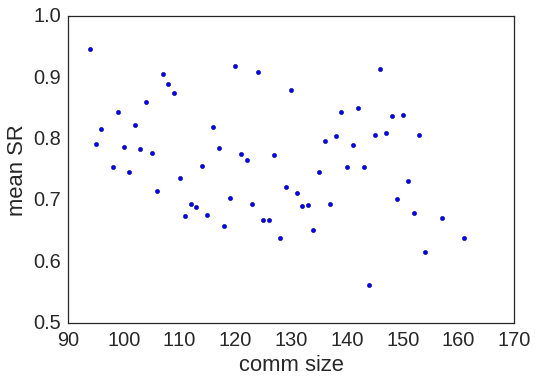

In [37]:
scatterplot_avg_SR_per_COMM_size()

In [16]:
def read_sem_capital(f_name='user_entities.tab', tname='entities'):
    f = open(f_name, "r")
    cap = defaultdict(int)
    cnt = 0
    for line in f:
        if tname == 'sentiment':
            (vid, vn, val) = line.split('\t')
            val = float(val)
        else:
            (vid, val) = line.split('\t')
            val = float(val)
        cap[vid] = val
        cnt += 1
    return cap

In [17]:
def find_avg_SEM_CAP(sem_cap, comm_nodes):
    s = []
    for node in comm_nodes:
        s.append(sem_cap[str(node)])
    s_mean = np.mean(np.array(s))
    s_std = np.std(np.array(s))
    return (s_mean, s_std)

In [18]:
def avg_SEM_CAP_per_COMM_size():
    output = read_output()
    sem_cap = read_sem_capital()
    size_vs_SEM_CAP = defaultdict(int)
    for comm_nodes in output.values():
        size_vs_SEM_CAP[len(comm_nodes)] = find_avg_SEM_CAP(sem_cap, comm_nodes)
    sorted_size_vs_SEM_CAP = OrderedDict(sorted(size_vs_SEM_CAP.items(), key=lambda t:t[0], reverse=True))
    return size_vs_SEM_CAP

In [41]:
def scatterplot_avg_SEM_CAP_per_COMM_size():
    size_vs_SEM_CAP = avg_SEM_CAP_per_COMM_size()
    x = np.array(size_vs_SEM_CAP.keys())
    y = np.array([s[0] for s in size_vs_SEM_CAP.values()])
    e = np.array([s[1] for s in size_vs_SEM_CAP.values()])
    print 'Corrcoef',  pearsonr(x, y)
    plt.scatter(x,y)
    plt.xlabel('comm size')
    plt.ylabel('mean sem cap')
    #plt.xscale('log')
    #plt.legend(loc='best',frameon=False)
    plt.show()

Corrcoef (0.18952536691114991, 0.14011518035189358)


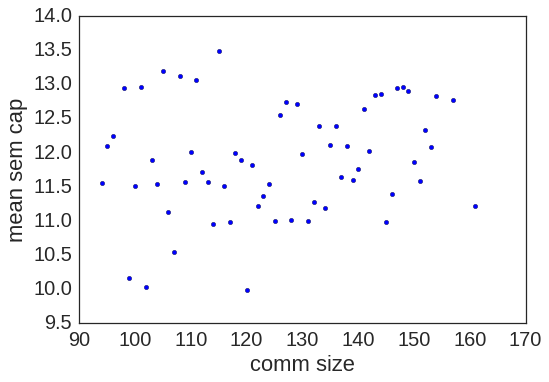

In [42]:
scatterplot_avg_SEM_CAP_per_COMM_size()

# Community membership i.e., pluralistic homophily

In [11]:
N_overlap_comm = 30

In [12]:
def how_many_nodes_with_pluralistic_level():
    node_comm_membership = find_nodes_in_more_COMM()
    pluralisic_classes_sizes = defaultdict(int)
    for node in node_comm_membership:
        pluralisic_classes_sizes[node_comm_membership[node]] += 1
    return pluralisic_classes_sizes
#how_many_nodes_with_pluralistic_level()       

In [55]:
# how similar is the node to his neighbors
def find_avg_neighborhood_SR_per_node_COMM_membership():
    node_comm_membership = find_nodes_in_more_COMM()
    G = read_in_SR_graph()
    res = defaultdict(list)
    for node in node_comm_membership:
        n = G.vs.select(name = str(node))
        nCOMM = node_comm_membership[node] if node_comm_membership[node] <= N_overlap_comm else N_overlap_comm
        try:
            total_SR = G.strength(n[0].index, weights='weight')
        except IndexError:
            continue
        total_neighbors = G.degree(n[0].index)
        meanSR =  total_SR / float(total_neighbors)
        res[nCOMM].append(meanSR)
    res_mean = defaultdict(float)
    res_stdev = defaultdict(float)
    for COMM in res:
        res_mean[COMM] = np.mean(np.array(res[COMM]))
        res_stdev[COMM] = np.std(np.array(res[COMM]))
    return res_mean, res_stdev

In [61]:
def plot_avg_neighborhood_SR_vs_COMM_membership():
    
    fig, ax1 = plt.subplots()
    ax1.set_xlabel('user comm membership')
    
    d, std = find_avg_neighborhood_SR_per_node_COMM_membership()
    x = d.keys()
    y = d.values()
    e = std.values()
    ax1.set_ylabel('mean node SR with neighbors', color='red')
    ax1.tick_params('y', colors='red')
    ax1.errorbar(x,y,e,linestyle="-",marker='*',color='red',fmt='o',elinewidth=2.0)
    ax1.set_xlim([0,N_overlap_comm+1])
    
    ax1.set_ylim([-0.5,1.5])
    
    ax2 = ax1.twinx()
    pluralistic_classes = how_many_nodes_with_pluralistic_level()
    z = np.array([pluralistic_classes[s] for s in x])
    ax2.scatter(x,z,marker='o',color='blue')
    ax2.plot(x,z,'-', color='blue')
    ax2.set_ylabel('total users', color='blue')
    ax2.tick_params('y', colors='blue')
    ax2.set_yscale('log')
    ax1.set_xlim([0,N_overlap_comm+1])
    
    print 'Corrcoef SR and comm membership ',  pearsonr(np.array(x), np.array(y))

    #plt.title(r'Histogram for mention network pairwise SR: $\mu=' +  "{:.3f}".format(mu) + '$, $\sigma= ' + "{:.3f}".format(sigma) + '$')
    #plt.grid(True)
    plt.savefig('SBM_overlap_node_comm_membership_vs_mean_SR.jpg', bbox_inches='tight')
    plt.show()

810
IGRAPH DNW- 26717 99910 -- 
+ attr: name (v), weight (e)
810
Corrcoef SR and comm membership  (-0.73676401498569932, 3.4425294477067015e-06)


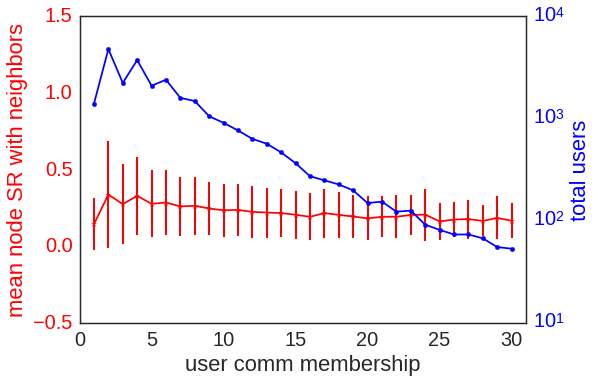

In [62]:
plot_avg_neighborhood_SR_vs_COMM_membership()

In [13]:
def find_avg_SEM_cap_per_node_COMM_membership():
    node_comm_membership = find_nodes_in_more_COMM()
    sem_cap = read_sem_capital()
    res = defaultdict(list)
    for node in node_comm_membership:
        n_sem = sem_cap[str(node)]
        nCOMM = node_comm_membership[node] if node_comm_membership[node] < N_overlap_comm else N_overlap_comm
        res[nCOMM].append(n_sem)
    res_mean = defaultdict(float)
    res_stdev = defaultdict(float)
    for COMM in res:
        res_mean[COMM] = np.mean(np.array(res[COMM]))
        res_stdev[COMM] = np.std(np.array(res[COMM]))
    return res_mean, res_stdev

In [14]:
def plot_SEM_CAP_vs_COMM_membership():
    fig, ax1 = plt.subplots()
    ax1.set_xlabel('user comm membership')
    
    d, std = find_avg_SEM_cap_per_node_COMM_membership()
    x = d.keys()
    y = d.values()
    e = std.values()
    ax1.set_ylabel('mean user semantic capital', color='darkred')
    ax1.tick_params('y', colors='darkred')
    ax1.errorbar(x,y,e,linestyle="-",marker='*',color='darkred',fmt='o',elinewidth=2.0)
    ax1.set_xlim([0,N_overlap_comm+1])
    
    ax1.set_ylim([-10,30])
    
    ax2 = ax1.twinx()
    pluralistic_classes = how_many_nodes_with_pluralistic_level()
    z = np.array([pluralistic_classes[s] for s in x])
    ax2.scatter(x,z,marker='o',color='blue')
    ax2.plot(x,z,'-', color='blue')
    ax2.set_ylabel('total users', color='blue')
    ax2.tick_params('y', colors='blue')
    ax2.set_yscale('log')
    ax1.set_xlim([0,N_overlap_comm+1])
    
    print 'Corrcoef SEM CAP and comm membership ',  pearsonr(np.array(x), np.array(y))
      
    #plt.tight_layout()
    plt.savefig('SBM_overlap_node_comm_membership_vs_avg_SEM_CAP.jpg', bbox_inches='tight')
    plt.show()

810
810
Corrcoef SEM CAP and comm membership  (0.87745582289321433, 1.9638232695848906e-10)


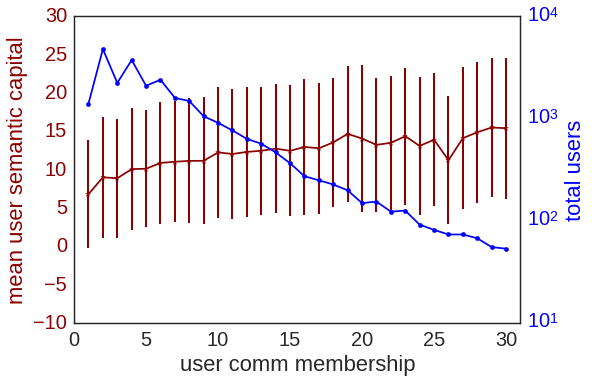

In [20]:
plot_SEM_CAP_vs_COMM_membership()

# Let us try something new with communities

In [82]:
N_shared = 15

In [164]:
def read_in_mention_graph():
    d = defaultdict(int)
    fn = 'mention_graph_weights.dat'
    f = open(fn, 'r')
    for line in f:
        (u1, u2, w) = line.split()
        d[int(u1), int(u2)] = int(w)
    return d

In [165]:
def find_node_interaction_comm_propensity():
    d = read_in_mention_graph()
    cnt_edges = 0
    node_comm_membership = find_nodes_COMM()
    comm_mem = defaultdict(list)
    comm_mem_total_pairs = defaultdict(list)
    
    max_shared = 0
    for (u1, u2) in d:
        comms_u1 = node_comm_membership[int(u1)]
        comms_u2 = node_comm_membership[int(u2)]
        shared = len(set(comms_u1).intersection(set(comms_u2)))
        if shared > max_shared:
            max_shared = shared
        if shared > N_shared:
            shared = N_shared 
        comm_mem[shared].append(d[(u1, u2)])
        if shared not in comm_mem_total_pairs:
            comm_mem_total_pairs[shared] = defaultdict(int)
        if u2 > u1:
            pom = u2
            u2 = u1
            u1 = pom
        comm_mem_total_pairs[shared][((u1, u2))] = 1
        cnt_edges += 1
    N = cnt_edges
    print N
    
    comm_mem_mean = OrderedDict()
    comm_mem_std = OrderedDict()
    

    for comm in comm_mem:
        comm_mem_mean[comm] = np.mean(np.array(comm_mem[comm]))
        comm_mem_std[comm] = np.std(np.array(comm_mem[comm]))
        comm_mem_total_pairs[comm] = sum(comm_mem_total_pairs[comm].values())
    print 'Max shared COMM ', max_shared
    return comm_mem_mean, comm_mem_std, comm_mem_total_pairs

In [166]:
def plot_interaction_comm_propensity():
    comm_mem_mean, comm_mem_std, comm_mem_total_pairs = find_node_interaction_comm_propensity()

    fig, ax1 = plt.subplots()
    ax1.set_xlabel('shared comm between nodes')
    
    x = comm_mem_mean.keys()
    y = comm_mem_mean.values()
    e = comm_mem_std.values()
    z = comm_mem_total_pairs.values()

    ax1.set_ylabel('communication intensity', color='r')
    ax1.tick_params('y', colors='r')
    ax1.errorbar(x,y,e,linestyle="-",marker='*',color='r',fmt='o',elinewidth=2.0)
    ax1.set_xlim([-1,N_shared+1])
    
    ax2 = ax1.twinx()
    ax2.scatter(x,z,marker='o',color='darkblue')
    ax2.plot(x,z,'-', color='darkblue')
    ax2.set_ylabel('total user pairs', color='darkblue')
    ax2.tick_params('y', colors='darkblue')
    ax2.set_yscale('log')
    ax2.set_xlim([-1,N_shared+1])
    
    plt.savefig('Infomap_node_shared_comm_vs_CI.jpg', bbox_inches='tight')
    
    print pearsonr(np.array(x), np.array(y))

99910
Max shared COMM  0
(nan, nan)


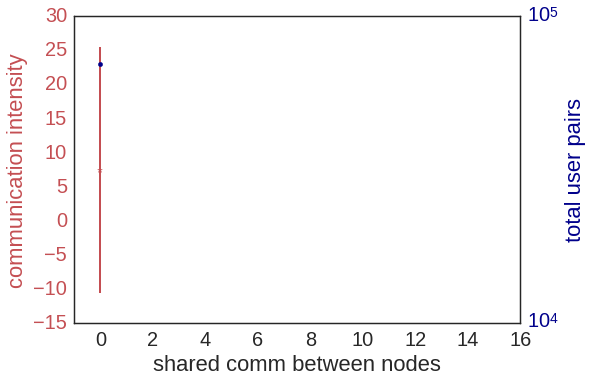

In [167]:
plot_interaction_comm_propensity()

# SR vs shared comm 

In [101]:
def read_in_SR_graph_simple():
    d = defaultdict(int)
    fn = 'mention_graph_IDs_with_SR.dat'
    f = open(fn, 'r')
    for line in f:
        (u1, u2, w) = line.split()
        d[int(u1), int(u2)] = float(w)
    return d

In [103]:
def find_node_SR_vs_shared_comm():
    d = read_in_SR_graph_simple()
    cnt_edges = 0
    node_comm_membership = find_nodes_COMM()
    comm_mem = defaultdict(list)
    comm_mem_total_pairs = defaultdict(list)
    
    max_shared = 0
    for (u1, u2) in d:
        comms_u1 = node_comm_membership[int(u1)]
        comms_u2 = node_comm_membership[int(u2)]
        shared = len(set(comms_u1).intersection(set(comms_u2)))
        if shared > max_shared:
            max_shared = shared
        if shared > N_shared:
            shared = N_shared 
        comm_mem[shared].append(d[(u1, u2)])
        if shared not in comm_mem_total_pairs:
            comm_mem_total_pairs[shared] = defaultdict(int)
        if u2 > u1:
            pom = u2
            u2 = u1
            u1 = pom
        comm_mem_total_pairs[shared][((u1, u2))] = 1
        cnt_edges += 1
    N = cnt_edges
    print N
    
    comm_mem_mean = OrderedDict()
    comm_mem_std = OrderedDict()
    

    for comm in comm_mem:
        comm_mem_mean[comm] = np.mean(np.array(comm_mem[comm]))
        comm_mem_std[comm] = np.std(np.array(comm_mem[comm]))
        comm_mem_total_pairs[comm] = sum(comm_mem_total_pairs[comm].values())
    print 'Max shared COMM ', max_shared
    return comm_mem_mean, comm_mem_std, comm_mem_total_pairs

In [104]:
def plot_SR_vs_shared_comm():
    comm_mem_mean, comm_mem_std, comm_mem_total_pairs = find_node_SR_vs_shared_comm()

    fig, ax1 = plt.subplots()
    ax1.set_xlabel('shared comm between nodes')
    
    x = comm_mem_mean.keys()
    y = comm_mem_mean.values()
    e = comm_mem_std.values()
    z = comm_mem_total_pairs.values()

    ax1.set_ylabel('SR', color='green')
    ax1.tick_params('y', colors='green')
    ax1.errorbar(x,y,e,linestyle="-",marker='*',color='green',fmt='o',elinewidth=2.0)
    ax1.set_xlim([-1,N_shared+1])
    
    ax1.set_ylim([-0.5,1.5])
    
    ax2 = ax1.twinx()
    ax2.scatter(x,z,marker='o',color='darkblue')
    ax2.plot(x,z,'-', color='darkblue')
    ax2.set_ylabel('total user pairs', color='darkblue')
    ax2.tick_params('y', colors='darkblue')
    ax2.set_yscale('log')
    ax2.set_xlim([-1,N_shared+1])
    
    plt.savefig('SBM_overlap_node_shared_comm_vs_SR.jpg', bbox_inches='tight')
   
    print pearsonr(np.array(x), np.array(y))

defaultdict(<type 'list'>, {0: [139], 1: [1410, 455, 712, 47, 1203, 436, 1303, 346, 991, 700, 445, 703], 2: [797], 3: [640, 1412, 776, 1545, 1266, 318], 4: [817, 426, 605, 903], 5: [1265, 1477, 29, 255], 6: [1264, 482, 1384, 1372, 1133, 1166, 591, 752, 849, 505, 1231, 348, 29], 7: [865, 1187, 936, 491, 1426, 50, 1463], 8: [1133, 469, 1365, 493], 9: [1408, 1417, 1018, 430], 10: [737, 578, 67, 1062, 529, 713, 714, 967, 1519, 49, 1363, 21, 790, 1449, 889, 538], 12: [897, 970, 1006, 408, 789, 184, 1226, 1045], 13: [289, 1442, 323, 1221, 6, 487, 567, 746, 331, 655, 963, 151, 312, 282, 1371], 14: [521, 462], 15: [1089, 851, 1206], 16: [120, 424], 17: [113, 859, 139, 643], 18: [393, 310], 19: [66, 1009, 1160, 585, 1066, 1533, 912, 17, 1429, 1257, 1567, 475, 221, 1022, 1183], 20: [660, 79], 21: [1121, 770, 580, 550, 297, 369, 435], 22: [1009, 23], 23: [1376, 1296, 905, 1136, 337, 1435], 24: [1320, 1345, 1035, 45, 534], 25: [878, 118], 26: [1016, 529, 1292, 397], 27: [482, 1155, 580, 809, 1162,

99910
Max shared COMM  215
(0.84583994947889052, 3.6537309638566068e-05)


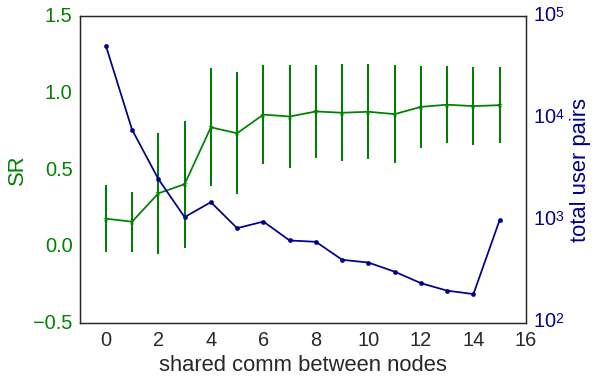

In [105]:
plot_SR_vs_shared_comm()

# Sentiment vs shared comm 

In [100]:
def find_node_sentiment_vs_shared_comm():
    d = read_in_SR_graph_simple()
    sent = read_sem_capital(f_name='user_sentiment.tab', tname='sentiment')
    cnt_edges = 0
    node_comm_membership = find_nodes_COMM()
    comm_mem = defaultdict(list)
    comm_mem_total_pairs = defaultdict(list)
    
    max_shared = 0
    for (u1, u2) in d:
        comms_u1 = node_comm_membership[int(u1)]
        comms_u2 = node_comm_membership[int(u2)]
        shared = len(set(comms_u1).intersection(set(comms_u2)))
        if shared > max_shared:
            max_shared = shared
        if shared > N_shared:
            shared = N_shared 
        comm_mem[shared].append(abs(sent[str(u1)] - sent[str(u2)]))
        if shared not in comm_mem_total_pairs:
            comm_mem_total_pairs[shared] = defaultdict(int)
        if u2 > u1:
            pom = u2
            u2 = u1
            u1 = pom
        comm_mem_total_pairs[shared][((u1, u2))] = 1
        cnt_edges += 1
    N = cnt_edges
    print N
    
    comm_mem_mean = OrderedDict()
    comm_mem_std = OrderedDict()
    

    for comm in comm_mem:
        comm_mem_mean[comm] = np.mean(np.array(comm_mem[comm]))
        comm_mem_std[comm] = np.std(np.array(comm_mem[comm]))
        comm_mem_total_pairs[comm] = sum(comm_mem_total_pairs[comm].values())
    print 'Max shared COMM ', max_shared
    return comm_mem_mean, comm_mem_std, comm_mem_total_pairs

In [98]:
def plot_sent_diff_vs_shared_comm():
    comm_mem_mean, comm_mem_std, comm_mem_total_pairs = find_node_sentiment_vs_shared_comm()

    fig, ax1 = plt.subplots()
    ax1.set_xlabel('shared comm between nodes')
    
    x = comm_mem_mean.keys()
    y = comm_mem_mean.values()
    e = comm_mem_std.values()
    z = comm_mem_total_pairs.values()

    ax1.set_ylabel('sentiment difference', color='gray')
    ax1.tick_params('y', colors='gray')
    ax1.errorbar(x,y,e,linestyle="-",marker='*',color='gray',fmt='o',elinewidth=2.0)
    ax1.set_xlim([-1,N_shared+1])
    
    ax1.set_ylim([-0.5,1])
    
    ax2 = ax1.twinx()
    ax2.scatter(x,z,marker='o',color='darkblue')
    ax2.plot(x,z,'-', color='darkblue')
    ax2.set_ylabel('total user pairs', color='darkblue')
    ax2.tick_params('y', colors='darkblue')
    ax2.set_yscale('log')
    ax2.set_xlim([-1,N_shared+1])
    
    
    plt.savefig('SBM_overlap_node_shared_comm_vs_sentiment.jpg', bbox_inches='tight')
    
    print pearsonr(np.array(x), np.array(y))

defaultdict(<type 'list'>, {0: [139], 1: [1410, 455, 712, 47, 1203, 436, 1303, 346, 991, 700, 445, 703], 2: [797], 3: [640, 1412, 776, 1545, 1266, 318], 4: [817, 426, 605, 903], 5: [1265, 1477, 29, 255], 6: [1264, 482, 1384, 1372, 1133, 1166, 591, 752, 849, 505, 1231, 348, 29], 7: [865, 1187, 936, 491, 1426, 50, 1463], 8: [1133, 469, 1365, 493], 9: [1408, 1417, 1018, 430], 10: [737, 578, 67, 1062, 529, 713, 714, 967, 1519, 49, 1363, 21, 790, 1449, 889, 538], 12: [897, 970, 1006, 408, 789, 184, 1226, 1045], 13: [289, 1442, 323, 1221, 6, 487, 567, 746, 331, 655, 963, 151, 312, 282, 1371], 14: [521, 462], 15: [1089, 851, 1206], 16: [120, 424], 17: [113, 859, 139, 643], 18: [393, 310], 19: [66, 1009, 1160, 585, 1066, 1533, 912, 17, 1429, 1257, 1567, 475, 221, 1022, 1183], 20: [660, 79], 21: [1121, 770, 580, 550, 297, 369, 435], 22: [1009, 23], 23: [1376, 1296, 905, 1136, 337, 1435], 24: [1320, 1345, 1035, 45, 534], 25: [878, 118], 26: [1016, 529, 1292, 397], 27: [482, 1155, 580, 809, 1162,

99910
Max shared COMM  215
(-0.86596712344264992, 1.4513084080497103e-05)


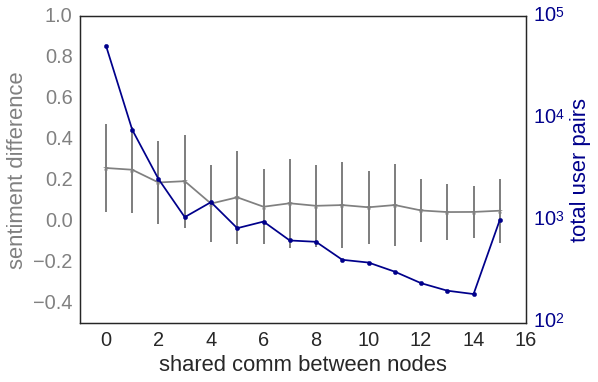

In [99]:
plot_sent_diff_vs_shared_comm()

# Community density

In [87]:
def find_overlapping_COMM():
    nodes_num_COMM = find_nodes_in_more_COMM()
    COMM_density = defaultdict(list)
    output = read_output()

    for comm in output:
        for node in output[comm]:
            COMM_density[comm].append(nodes_num_COMM[int(node)])
            
    COMM_density2 =  defaultdict(tuple)
    for COMM in COMM_density:
        COMM_density2[COMM] = (np.mean(np.array(COMM_density[COMM])), len(COMM_density[COMM]))
    COMM_density3 = OrderedDict(sorted(COMM_density2.items(), key=lambda t:t[1][0]))
    
    return COMM_density3

In [90]:
def plot_COMM_size_vs_density():
    import seaborn as sns
    sns.set(color_codes=True, font_scale=2) 

    x = []
    y = []

    data = find_overlapping_COMM()
    
    for COMM in data:
        x.append(data[COMM][0])
        y.append(data[COMM][1])

    x = np.array(x)
    y = np.array(y)

    print 'Corrcoef COMM size and density ',  pearsonr(np.array(x), np.array(y))
    (r, p) = pearsonr(np.log(np.array(x)), np.array(y))

    lab = r'$r=' +  "{:.2f}".format(r) + '$, $p= ' + "{:.2f}".format(p) + '$'
    xlabel = 'comm density'
    ylabel = 'comm size'

    sns.set_style("white")
    plt.scatter(x, y, edgecolors='none', c='c', label=lab)
    
    #g = sns.jointplot(x=x, y=y, kind='reg',annot_kws=dict(stat="r"),   \
    #    joint_kws={'line_kws':{'color':'gray', 'alpha':0.3, 'markeredgewidth':0}}).set_axis_labels(xlabel, ylabel)

    #regline = g.ax_joint.get_lines()[0]
    #regline.set_color('c')
    #regline.set_zorder('5')
    
    #ax = g.ax_joint
    #ax.set_xscale('log')
    #g.ax_marg_x.set_xscale('log')

    #labelsx = ['0','','1','', '2','', '3','','4']
    #g.ax_joint.set_xticklabels(labelsx)
    
    #plt.yscale('log')

    #plt.legend(frameon=0, loc=2)
    #plt.show()
    #plt.tight_layout()
    plt.savefig('node_comm_size_density777.pdf',bbox_inches='tight' , dpi=550)
    plt.show()

100
Corrcoef COMM size and density  (-0.1346547348073163, 0.18164408446472341)


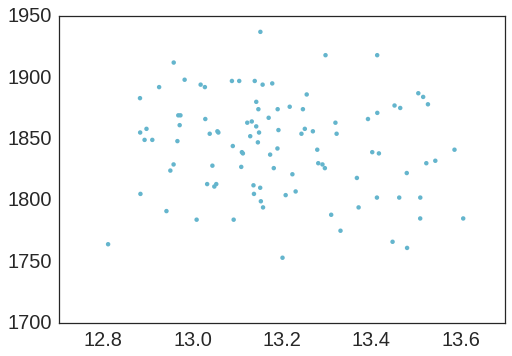

In [91]:
plot_COMM_size_vs_density()

In [65]:
def find_avg_ST_INC_per_node_COMM_membership():
    node_comm_membership = find_nodes_in_more_COMM()
    sem_cap = read_sem_capital(f_name='status_inconsistency', tname='status_inconsistency')
    res = defaultdict(list)
    for node in node_comm_membership:
        n_sem = sem_cap[str(node)] 
        nCOMM = node_comm_membership[node] if node_comm_membership[node] < N_overlap_comm else N_overlap_comm
        res[nCOMM].append(n_sem)
    res_mean = defaultdict(float)
    res_stdev = defaultdict(float)
    for COMM in res:
        res_mean[COMM] = np.mean(np.array(res[COMM]))
        res_stdev[COMM] = np.std(np.array(res[COMM]))
    return res_mean, res_stdev

In [70]:
def plot_ST_INC_vs_COMM_membership():
    
    fig, ax1 = plt.subplots()
    ax1.set_xlabel('user comm membership')
    
    d, std = find_avg_ST_INC_per_node_COMM_membership()
    x = d.keys()
    y = d.values()
    e = std.values()
    ax1.set_ylabel('mean user $st_{inc}$', color='darkcyan')
    ax1.tick_params('y', colors='darkcyan')
    ax1.errorbar(x,y,e,linestyle="-",marker='*',color='darkcyan',fmt='o',elinewidth=2.0)
    ax1.set_xlim([0,N_overlap_comm+1])
    
    ax1.set_ylim([-1.5,1.5])
    
    ax2 = ax1.twinx()
    pluralistic_classes = how_many_nodes_with_pluralistic_level()
    z = np.array([pluralistic_classes[s] for s in x])
    ax2.scatter(x,z,marker='o',color='darkblue')
    ax2.plot(x,z,'-', color='darkblue')
    ax2.set_ylabel('total users', color='darkblue')
    ax2.tick_params('y', colors='darkblue')
    ax2.set_yscale('log')
    ax1.set_xlim([0,N_overlap_comm+1])
    
    print 'Corrcoef ST INC and comm membership ',  pearsonr(np.array(x), np.array(y))
      
    #plt.tight_layout() 
    plt.savefig('SBM_overlap_node_comm_membership_vs_mean_ST_INC.eps', bbox_inches='tight')
    plt.show()

810
810
Corrcoef ST INC and comm membership  (0.7678195815154566, 7.3337993561651293e-07)


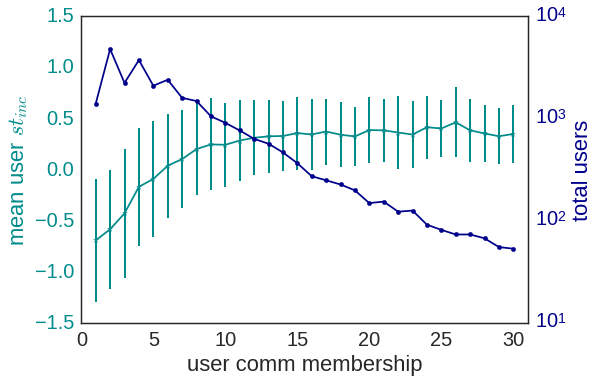

In [71]:
plot_ST_INC_vs_COMM_membership()

# Sentiment

In [97]:
def find_avg_sentiment_per_node_COMM_membership():
    node_comm_membership = find_nodes_in_more_COMM()
    sem_cap = read_sem_capital(f_name='user_sentiment.tab', tname='sentiment')
    res = defaultdict(list)
    for node in node_comm_membership:
        n_sem = sem_cap[str(node)]
        nCOMM = node_comm_membership[node] if node_comm_membership[node] < N_overlap_comm else N_overlap_comm
        res[nCOMM].append(n_sem)
    res_mean = defaultdict(float)
    res_stdev = defaultdict(float)
    for COMM in res:
        res_mean[COMM] = np.mean(np.array(res[COMM]))
        res_stdev[COMM] = np.std(np.array(res[COMM]))
    return res_mean, res_stdev

In [100]:
def plot_sentiment_vs_COMM_membership():
    d, std = find_avg_sentiment_per_node_COMM_membership()
    x = d.keys()
    y = d.values()
    e = std.values()
    print 'Corrcoef sentiment and comm membership ',  pearsonr(np.array(x), np.array(y))
    plt.errorbar(x,y,e,linestyle="-",marker='*',color='darkcyan',label='mean sentiment per comm membership ')
    #plt.yscale('log', nonposy='clip')
    plt.xlabel('node comm membership')
    plt.ylabel('mean node sentiment')
    #plt.legend(loc=2,frameon=False)
    plt.xlim(0,N_overlap_comm+1)
    #plt.ylim(-0.1,0.1)
    #plt.title(r'Histogram for mention network pairwise SR: $\mu=' +  "{:.3f}".format(mu) + '$, $\sigma= ' + "{:.3f}".format(sigma) + '$')
    #plt.grid(True)
    plt.savefig('node_comm_membership_vs_avg_sentiment.jpg')
    plt.show()

100
Corrcoef sentiment and comm membership  (0.20478338206311464, 0.46408899060042141)


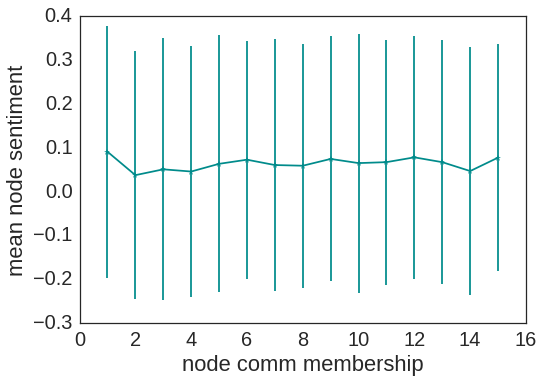

In [101]:
plot_sentiment_vs_COMM_membership()

# Entities, concepts, taxonomies etc.

In [112]:
##################################################
# read in a map for the twitter username --> id
##################################################
def read_user_IDs():

    user_ids = defaultdict(str)

    with codecs.open('../user_IDs.dat','r', encoding='utf8') as f:
        for line in f:
            line = line.split()
            user_id = line[0]
            user =  line[1]
            user_ids[user] = int(user_id)

    return user_ids

In [113]:
def plot_taxonomy(tokens, weights, max_tokens, tokens_name, COM='ALL'):
    df = pd.DataFrame({'token': tokens, 'weight': weights})
    df.sort('weight', inplace=True, ascending=False)
    if df.shape[0] > max_tokens:
        tail = df.ix[max_tokens:, 'weight'].sum()
        df2 = df.iloc[0:max_tokens].copy()
        nrow = pd.Series({'token': '--[other ' + tokens_name + ']--', 'weight': tail})
        df2.ix[df2.shape[0]] = nrow
        df2.index = np.arange(df2.shape[0])
    else:
        df2 = df
        
    # Let's plot something better than a word cloud!

    plt.figure(figsize=(10,5))
    plt.title('community ' + COM)
    colors = []
    for c in range(df2.shape[0]-1):
        colors.append('#383838')
    colors.append('#ebe728')
    plt.barh(df2.index * -1, np.log(df2['weight']), color=colors)
    plt.gca().yaxis.grid(False)
    plt.yticks(df2.index * -1 + 1.0, df2['token'])
    plt.ylim(-1 * df2.shape[0] + 1.4, 1)
    plt.xlabel(tokens_name + ' weight')
    plt.savefig(COM+tokens_name+'.jpg', bbox_inches='tight')
    if tokens_name == 'entity':
        plt.show()

In [140]:
##################################################
# the core function for the user lists, comm etc.
##################################################
"""
    here, the options are to visualize the taxonomy for the whole dataset (COM="ALL")
    and to visualize for different communities (COM="COM") that are read in through read_in_communities()
    in the case of communities, this functions is invoked once per each community
    -- user_list holds the ids of the users in one community
    -- TOP_N holds the number of top concepts, keywords and entities that we want to visualize and record
    -- user_com holds a map for user_id --> com_id
    -- N_COM holds the total number of communities found (changes depending on the community detection algorithm)
"""
def find_taxonomy_of_user_list(user_ids=read_user_IDs(), COM='ALL', user_list=None, TOP_N=20):

    # resulting dictionaries in which the counts and tfidf relevance are collected
    keywords_sum = defaultdict(int)
    entities_sum = defaultdict(int)
    concepts_sum = defaultdict(int)
    taxonomies_sum = defaultdict(int) 
    
    docSentiment_sum = defaultdict(int)
    
    #print len(user_list), COM

    cnt = 0
    with codecs.open('../tweets_taxonomy_clean.JSON','r', encoding='utf8') as input_file:
        for line7s in input_file:
            try:
                line = json.loads(line7s)
                user_name = line["_id"]
                user_name = str(user_name)
                user_id = user_ids[user_name]
                if user_list is not None:
                    if not user_id in user_list:
                        continue
                # if dealing with ALL, take all the users
                taxonomy_all = line["taxonomy"]
                keywords = taxonomy_all["keywords"]
                entities = taxonomy_all["entities"]
                concepts = taxonomy_all["concepts"] 
                taxonomy = taxonomy_all["taxonomy"] 
                #
                docSentiment = taxonomy_all["docSentiment"] 
                # this counts how many user we have analyzed
                cnt += 1
            except KeyError:
                #print line7s
                # we don't print since it is tested, there some 10% users for whom
                # the taxonomy was not successfuly downloaded and they would be listed here
                continue
            
            for el in keywords:
                category = el["text"]
                # if we first time encounter this keyword, add a dict for it in the result
                if not category in keywords_sum:
                    keywords_sum[category] = defaultdict(int)
                # we use this not so well coded part because tuples do not allow assignment
                old_relev = keywords_sum[category][0]
                old_cnt = keywords_sum[category][1]
                new_relev = old_relev + float(el["relevance"])
                new_cnt = old_cnt + 1
                keywords_sum[category] = (new_relev, new_cnt)

            for el in entities:
                entity = el["text"]
                if entity in ['#', '#MentionTo', 'twitter', 'Twitter']:
                    continue
                # if we first time encounter this entity, add a dict for it in the result
                if not entity in entities_sum:
                    entities_sum[entity] = defaultdict(int)
                # we use this not so well coded part because tuples do not allow assignment
                old_relev = entities_sum[entity][0]
                old_cnt = entities_sum[entity][1]
                new_relev = old_relev + float(el["relevance"])
                new_cnt = old_cnt + 1
                entities_sum[entity] = (new_relev, new_cnt, el["type"])

            for el in concepts:
                concept = el["text"]
                if concept in ['Trigraph', 'Gh', 'trigraph']:
                    continue
                # if we first time encounter this concept, add a dict for it in the result
                if not concept in concepts_sum:
                    concepts_sum[concept] = defaultdict(int)
                # we use this not so well coded part because tuples do not allow assignment
                old_relev = concepts_sum[concept][0]
                old_cnt = concepts_sum[concept][1]
                new_relev = old_relev + float(el["relevance"])
                new_cnt = old_cnt + 1
                concepts_sum[concept] = (new_relev, new_cnt)

            # a bit different procedure for extracting the sentiment
            sentiment = docSentiment["type"]
            if sentiment == "neutral":
                docSentiment_sum[sentiment] += 1
            else:
                if not sentiment in docSentiment_sum:
                    docSentiment_sum[sentiment] = defaultdict(int)
                old_score = docSentiment_sum[sentiment][0]
                old_cnt = docSentiment_sum[sentiment][1]
                old_mixed_cnt = docSentiment_sum[sentiment][2]
                try:
                    new_score = old_score + float(docSentiment["score"])
                except KeyError:
                    continue
                new_cnt = old_cnt + 1
                try:
                    new_mixed_cnt = old_mixed_cnt + int(docSentiment["mixed"])
                except KeyError:
                    continue
                docSentiment_sum[sentiment] = (new_score, new_cnt, new_mixed_cnt)


            for el in taxonomy:
                taxonomy_tree = el["label"]
                taxon = taxonomy_tree
                if not taxon in taxonomies_sum:
                    taxonomies_sum[taxon] = defaultdict(int)
                old_score = taxonomies_sum[taxon][0]
                old_cnt = taxonomies_sum[taxon][1]
                new_score = old_score + float(el["score"])
                new_cnt = old_cnt + 1
                taxonomies_sum[taxon] = (new_score, new_cnt)

        com_size = cnt
        # THIS IS A CONSTANT, because we know how many users there are in total after we did one ALL run
        N = 27665
        print "*** The user list %s ***" % COM
        print "Analyzed %d users out of total %d users " % (com_size, N)
        try:
            pos_users = docSentiment_sum["positive"][1]
            pos_score = docSentiment_sum["positive"][0]
        except TypeError:
            pos_users = 0
            pos_score = 0
        try:
            neg_users = docSentiment_sum["negative"][1]
            neg_score = docSentiment_sum["negative"][0]
        except TypeError:
            neg_users = 0
            neg_score = 0
        try:
            neu_users = docSentiment_sum["neutral"]
        except TypeError:
            neu_users = 0
        """
        print "___________________"
        print "Sentiment stats: positive %d users; negative %d users; and neutral %d " % (pos_users, neg_users, neu_users)
        print "Sentiment score: positive %f ; negative %f; and the sum sentiment %f " % (pos_score, neg_score, pos_score + neg_score)
        print "Overall positive sentiment pct is %f " % (float(pos_users)/com_size)
        print "___________________"
        print "Total keywords found ", len(keywords_sum)
        print "Total entities found ", len(entities_sum)
        print "Total concepts found ", len(concepts_sum)
        print "Total taxonomies on different levels found ", len(taxonomies_sum)
        print "___________________"
        """

        #####################
        ## STARTS plotting ##
        #####################
        
        #####################
        ##    KEYWORDS     ##
        #####################
        for kw in keywords_sum:
            tot_relev = keywords_sum[kw][0]
            tot_cnt = keywords_sum[kw][1]
            inv_kw_fq = 0 if tot_cnt == 0 else N/float(tot_cnt)
            tfidf = float(tot_relev * math.log(1.0 + inv_kw_fq))
            keywords_sum[kw] = (tot_relev, tot_cnt, tfidf)
        
        #print
        #print "Keywords (ordered by TF-IDF): [relevance, count, TF-IDF]"
        ord_keywords_sum2 = OrderedDict(sorted(keywords_sum.items(), key=lambda x: x[1][0], reverse = True))
        NN = len(ord_keywords_sum2.items())
        labels = np.empty([NN], dtype="<U26")
        sizes = np.empty([NN], dtype=float)
        sizes_tot = np.empty([NN], dtype=float)
        i = 0
        for el in ord_keywords_sum2:
            #print el.encode('utf-8'), ord_keywords_sum2[el]
            labels[i] = el
            sizes[i] = float(ord_keywords_sum2[el][1])
            sizes_tot[i] = float(ord_keywords_sum2[el][0])
            i += 1
            #if i == TOP_N:
            #    break

                
        plot_taxonomy(tokens=labels, weights=sizes_tot, max_tokens=TOP_N, tokens_name='keyword', COM=COM)
        #plot_taxonomy(labels, sizes_tot, "kw_com_" + str(COM) + ".png")
        plt.clf()
        #print

        #####################
        ##    ENTITIES     ##
        #####################
        for en in entities_sum:
            tot_relev = entities_sum[en][0]
            tot_cnt = entities_sum[en][1]
            inv_ent_fq = 0 if tot_cnt == 0 else N/float(tot_cnt)
            tfidf = tot_relev * math.log(1.0 + inv_ent_fq)
            entities_sum[en] = (tot_relev, tot_cnt, tfidf)  

        #print "Entities (sorted by TF-IDF): [relevance, count, TF-IDF]"
        ord_entities_sum2 = OrderedDict(sorted(entities_sum.items(), key=lambda x: x[1][0], reverse = True))
        NN = len(ord_keywords_sum2.items())
        labels = np.empty([NN], dtype="<U26")
        sizes = np.empty([NN], dtype=float)
        sizes_tot = np.empty([NN], dtype=float)
        i = 0
        for el in ord_entities_sum2:
            #print el.encode('utf-8'), ord_entities_sum2[el]
            labels[i] = el
            #print labels
            sizes_tot[i] = float(ord_entities_sum2[el][0])
            sizes[i] = float(ord_entities_sum2[el][2])
            i += 1
            #if i == TOP_N:
            #    break

        plot_taxonomy(tokens=labels, weights=sizes_tot, max_tokens=TOP_N, tokens_name='entity', COM=COM)
        plt.clf()
        #print

        #####################
        ##    CONCEPTS     ##
        #####################
        for conc in concepts_sum:
            tot_relev = concepts_sum[conc][0]
            tot_cnt = concepts_sum[conc][1]
            inv_fq = 0 if tot_cnt == 0 else N/float(tot_cnt)
            tfidf = float(tot_relev * math.log(1.0 + inv_fq))
            concepts_sum[conc] = (tot_relev, tot_cnt, tfidf)

        #print "Concepts (sorted by TF-IDF): [relevance, count, TF-IDF]"
        ord_concepts_sum = OrderedDict(sorted(concepts_sum.items(), key=lambda x: x[1][0], reverse = True))
        NN = len(ord_keywords_sum2.items())
        labels = np.empty([NN], dtype="<U26")
        sizes = np.empty([NN], dtype=float)
        sizes_tot = np.empty([NN], dtype=float)
        i = 0
        for el in ord_concepts_sum:
            #print el.encode('utf-8'), ord_concepts_sum[el]
            labels[i] = el
            sizes[i] = float(ord_concepts_sum[el][2])
            sizes_tot[i] = float(ord_concepts_sum[el][0])
            i += 1
            #if i == TOP_N:
            #    break

        plot_taxonomy(tokens=labels, weights=sizes_tot, max_tokens=TOP_N, tokens_name='concept', COM=COM)
        #plot_pie(labels, sizes_tot, "concept_" + str(COM) + ".png")
        plt.clf()
        #print

        #####################
        ##   TAXONOMIES    ##
        #####################
        for taxon in taxonomies_sum:
            tot_score = taxonomies_sum[taxon][0]
            tot_cnt = taxonomies_sum[taxon][1]
            inv_fq = 0 if tot_cnt == 0 else N/float(tot_cnt)
            tfidf = float(tot_score * math.log(1.0 + inv_fq))
            taxonomies_sum[taxon] = (tot_score, tot_cnt, tfidf)


        #print "Taxonomies (sorted by TF-IDF): [relevance, count, TF-IDF]"
        ord_taxonomies_sum = OrderedDict(sorted(taxonomies_sum.items(), key=lambda x: x[1][0], reverse = True))
        NN = len(ord_keywords_sum2.items())
        labels = np.empty([NN], dtype="<U26")
        sizes = np.empty([NN], dtype=float)
        sizes_tot = np.empty([NN], dtype=float)
        i = 0
        for el in ord_taxonomies_sum:
            #print el.encode('utf-8'), ord_taxonomies_sum[el]
            labels[i] = el
            sizes[i] = float(ord_taxonomies_sum[el][2])
            sizes_tot[i] = float(ord_taxonomies_sum[el][0])
            i += 1
            #if i == TOP_N:
            #    break

        plot_taxonomy(tokens=labels, weights=sizes_tot, max_tokens=TOP_N, tokens_name='taxonomy', COM=COM)
        #plot_pie(labels, sizes_tot, "taxon_" + str(COM) + ".png")
        plt.clf()
        #print

In [141]:
def main(sizeN='ALL'):

    if sizeN == "ALL":
        #sys.stdout = open('../ALL/top_20_stats', 'w')
        find_taxonomy_of_user_list()
    else:
        #sys.stdout = open('InfoMap_taxonomy_stats_' + f_in_Infomap_output_comm + '.txt', 'w')
        top_communities = read_in_top_communities(sizeN)
        #print len(top_communities), "top communities found of size", str(sizeN)

        for community in top_communities:
            # user_ids=read_user_IDs(), COM='ALL', user_list=None, TOP_N=20
            user_list_int = [int(x) for x in top_communities[community]]
            find_taxonomy_of_user_list(user_ids=read_user_IDs(), COM=str(community), user_list=user_list_int, TOP_N=20)


*** The user list 1010 ***
Analyzed 158 users out of total 27665 users 


/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  This is separate from the ipykernel package so we can avoid doing imports until


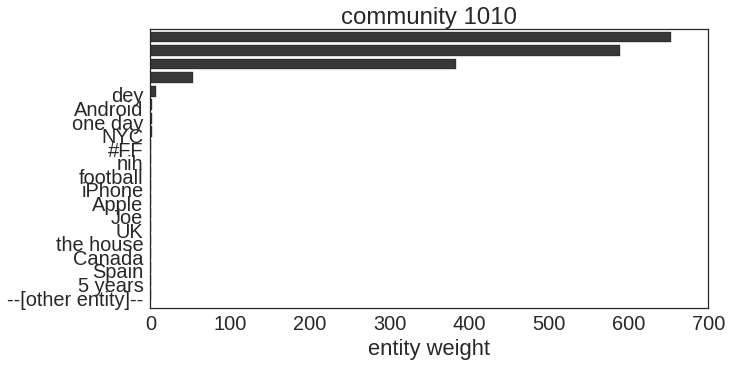

*** The user list 81 ***
Analyzed 155 users out of total 27665 users 


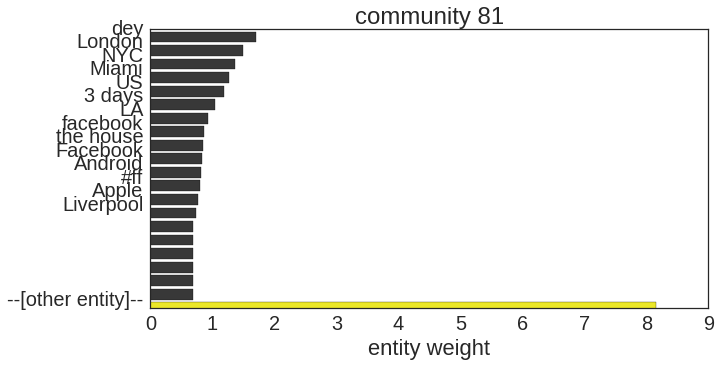

*** The user list 127 ***
Analyzed 157 users out of total 27665 users 


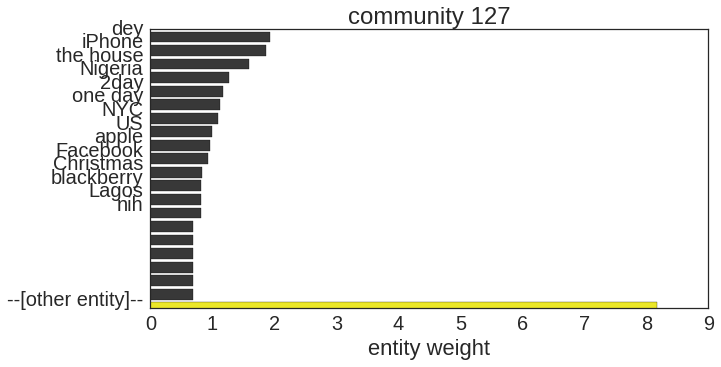

*** The user list 420 ***
Analyzed 157 users out of total 27665 users 


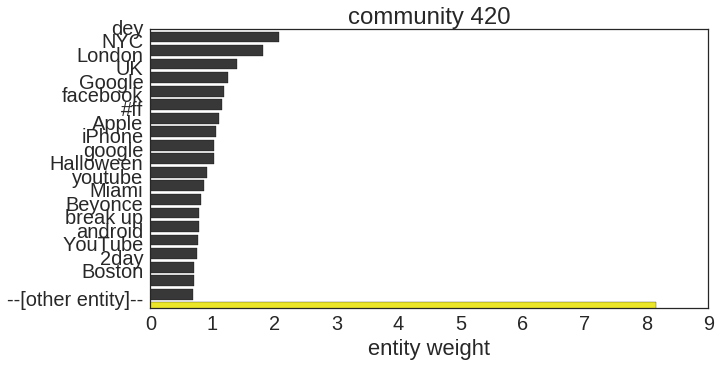

*** The user list 1500 ***
Analyzed 155 users out of total 27665 users 


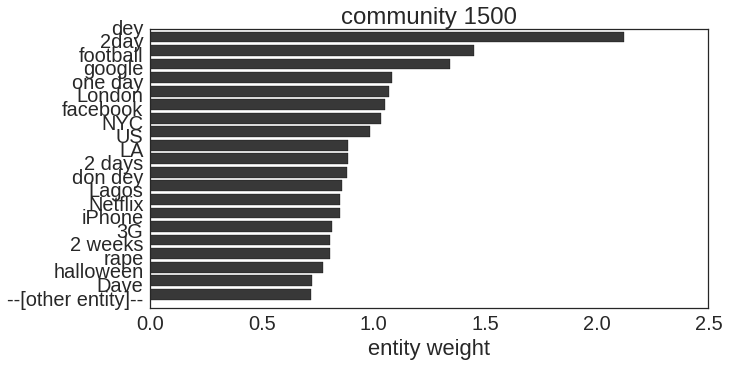

*** The user list 375 ***
Analyzed 151 users out of total 27665 users 


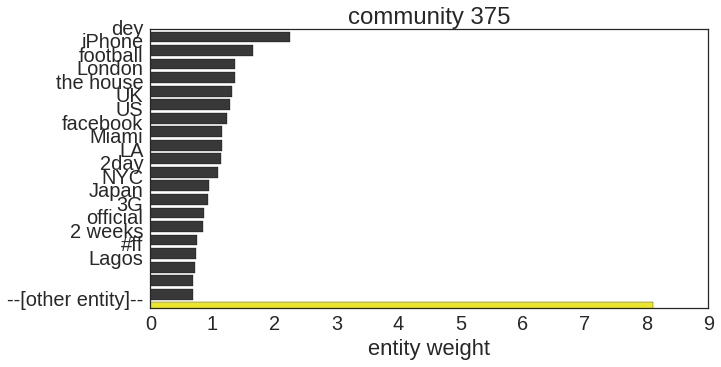

*** The user list 1057 ***
Analyzed 151 users out of total 27665 users 


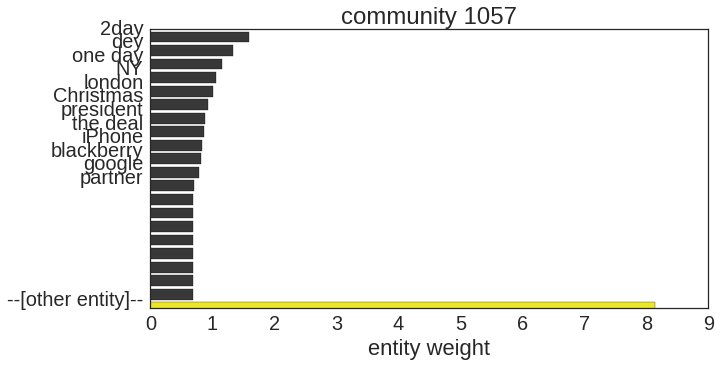

*** The user list 4 ***
Analyzed 144 users out of total 27665 users 


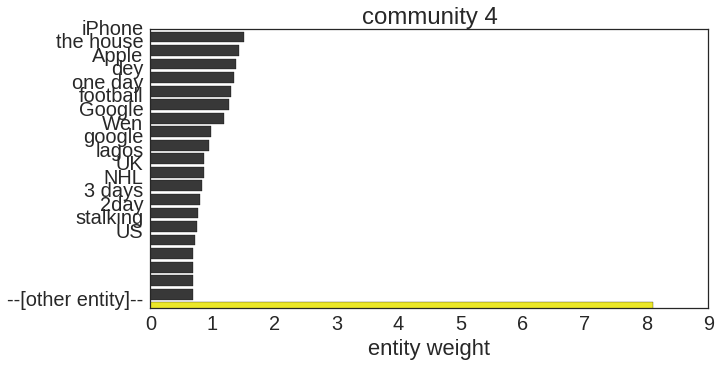

*** The user list 465 ***
Analyzed 152 users out of total 27665 users 


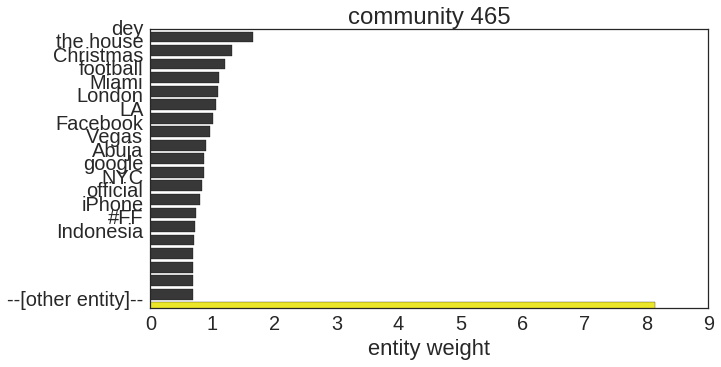

*** The user list 949 ***
Analyzed 151 users out of total 27665 users 


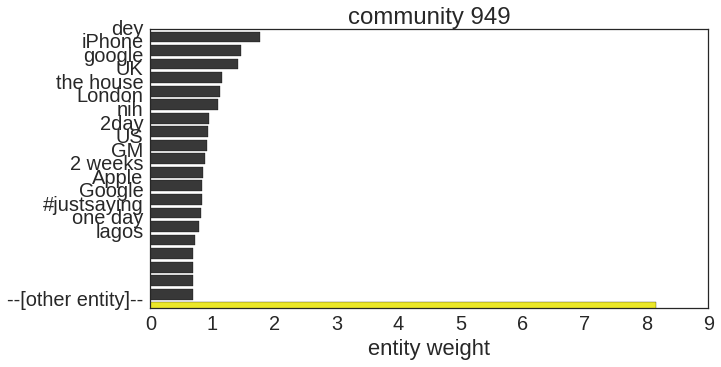

*** The user list 1101 ***
Analyzed 151 users out of total 27665 users 


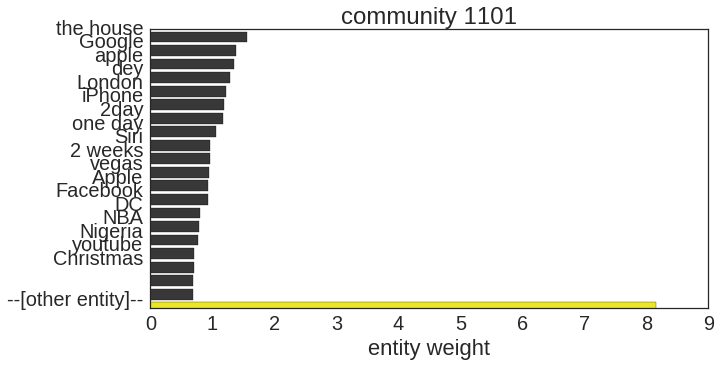

*** The user list 1341 ***
Analyzed 150 users out of total 27665 users 


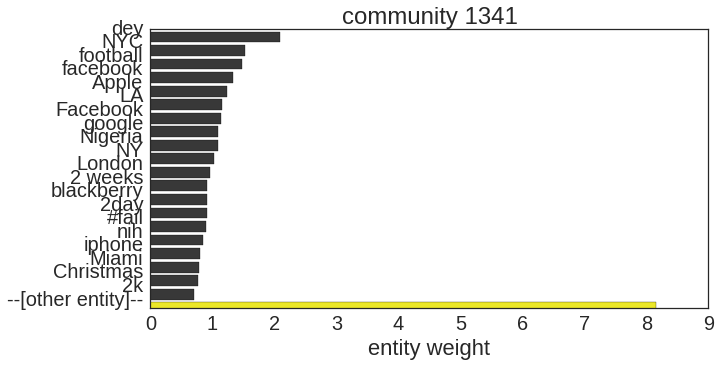

*** The user list 1528 ***
Analyzed 151 users out of total 27665 users 


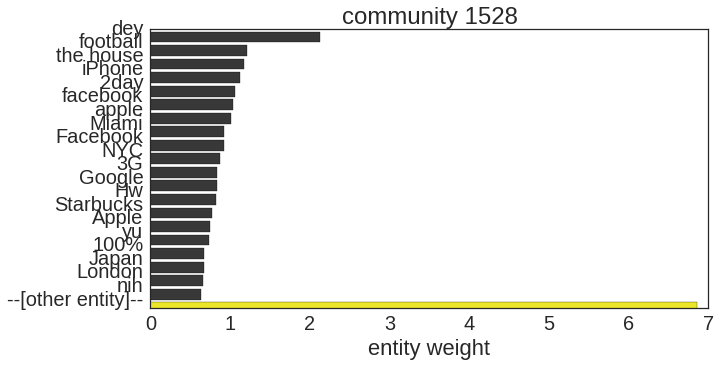

*** The user list 1561 ***
Analyzed 148 users out of total 27665 users 


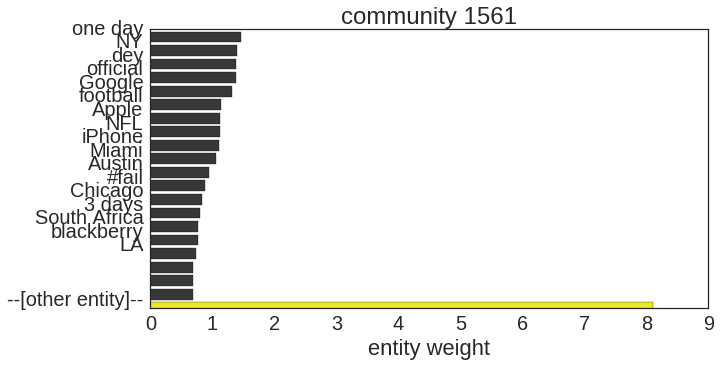

*** The user list 870 ***
Analyzed 148 users out of total 27665 users 


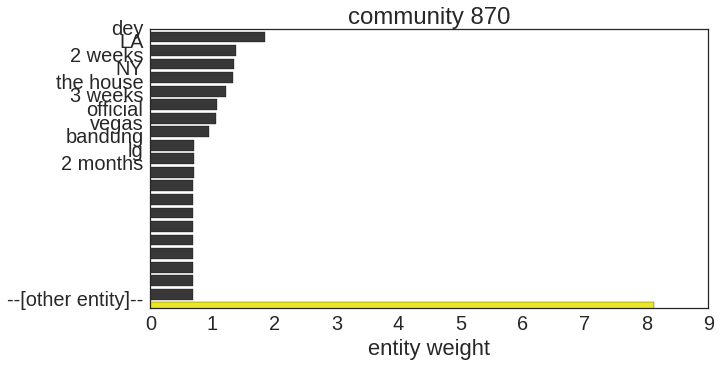

*** The user list 60 ***
Analyzed 148 users out of total 27665 users 


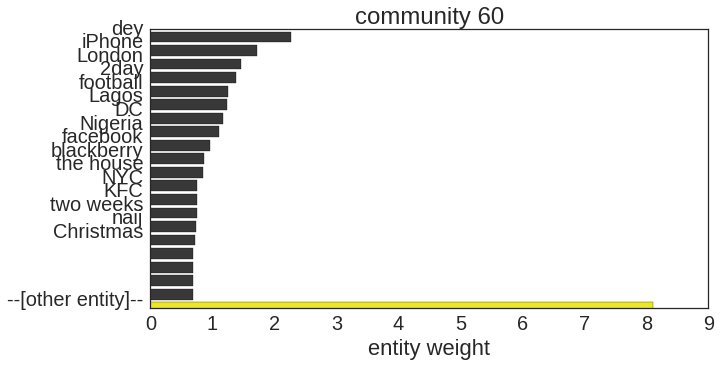

*** The user list 62 ***
Analyzed 150 users out of total 27665 users 


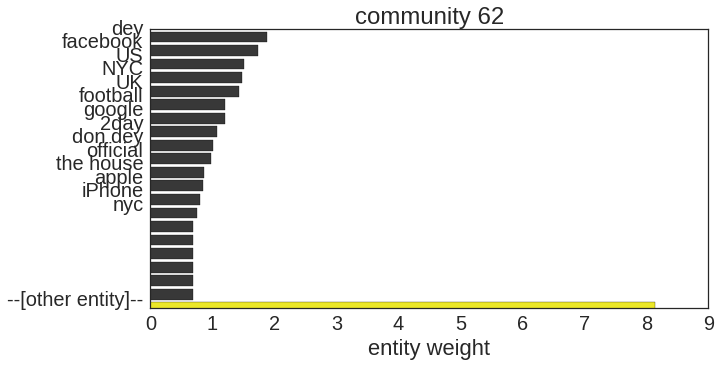

*** The user list 218 ***
Analyzed 145 users out of total 27665 users 


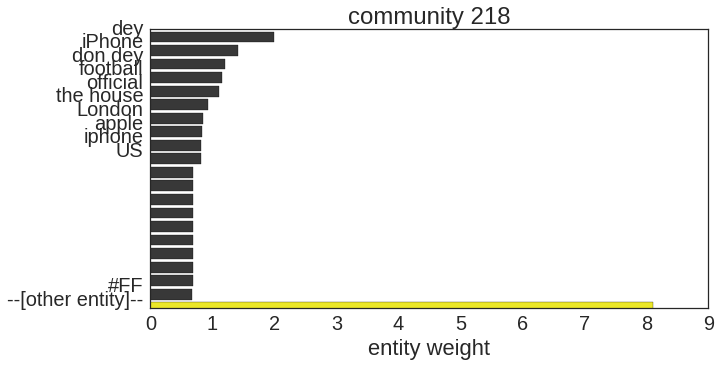

*** The user list 365 ***
Analyzed 149 users out of total 27665 users 


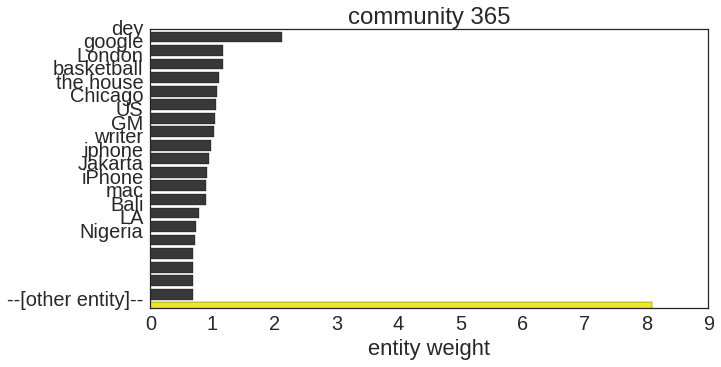

*** The user list 433 ***
Analyzed 148 users out of total 27665 users 


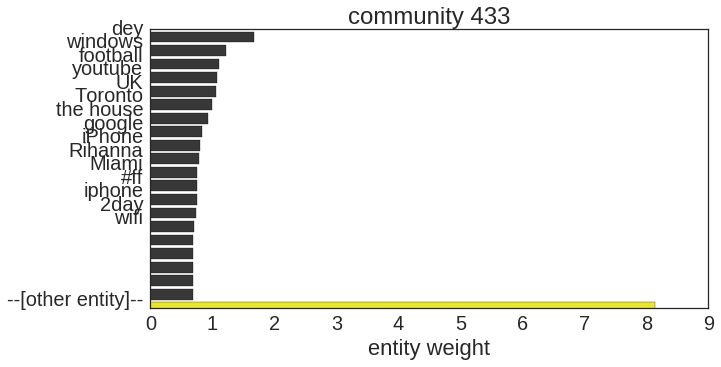

*** The user list 1078 ***
Analyzed 145 users out of total 27665 users 


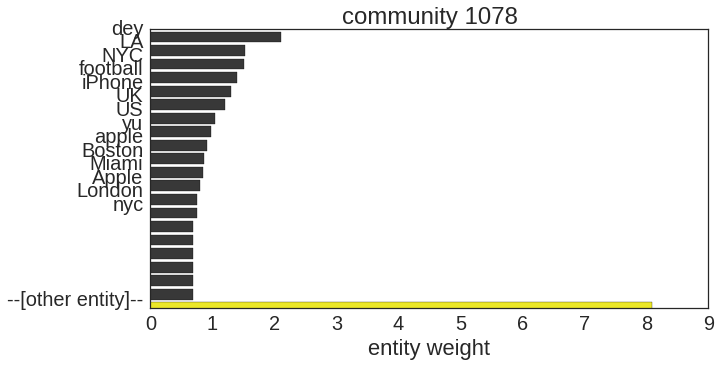

*** The user list 1089 ***
Analyzed 147 users out of total 27665 users 


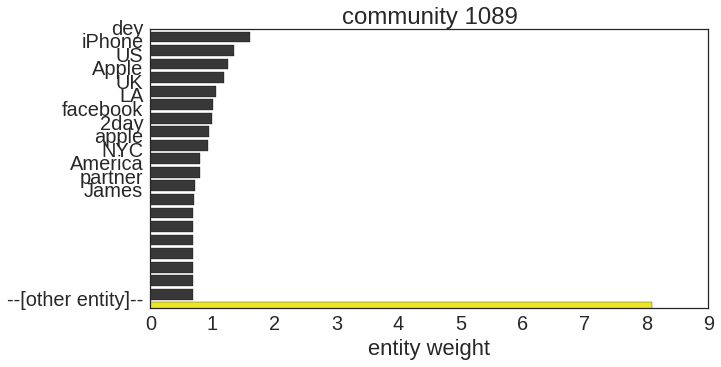

*** The user list 544 ***
Analyzed 145 users out of total 27665 users 


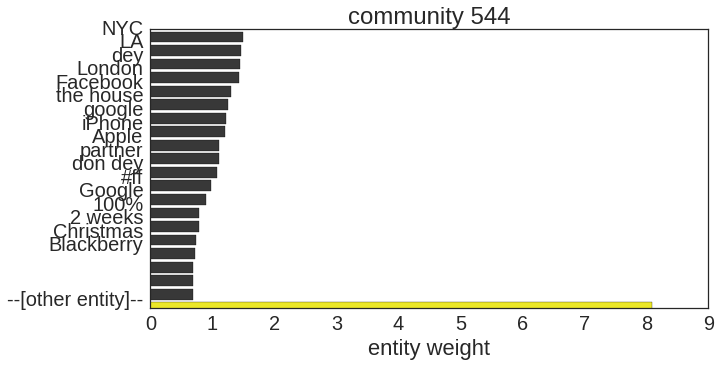

*** The user list 687 ***
Analyzed 148 users out of total 27665 users 


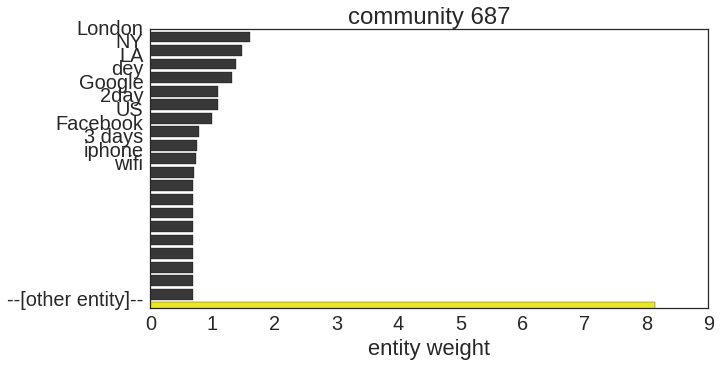

*** The user list 794 ***
Analyzed 147 users out of total 27665 users 


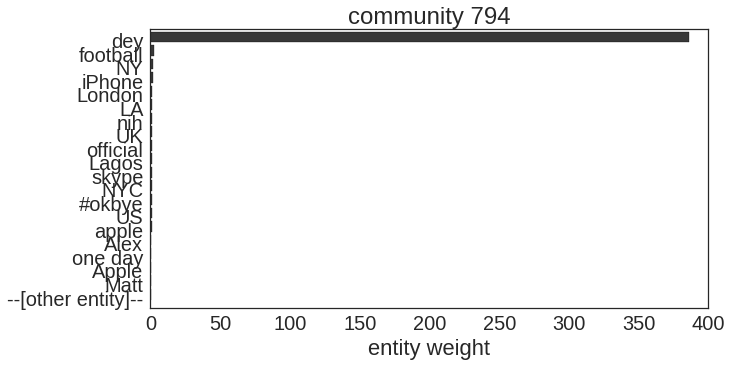

*** The user list 1076 ***
Analyzed 147 users out of total 27665 users 


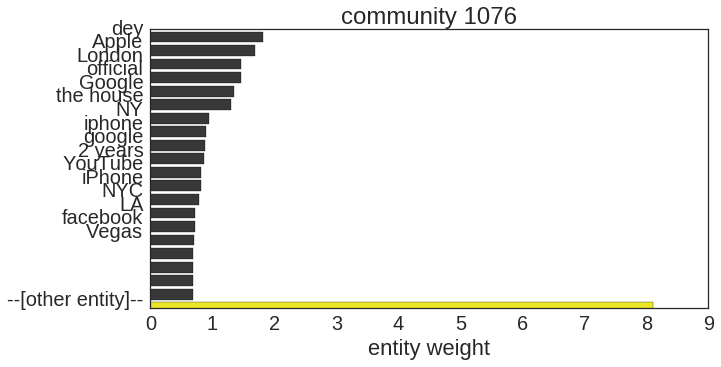

*** The user list 1083 ***
Analyzed 146 users out of total 27665 users 


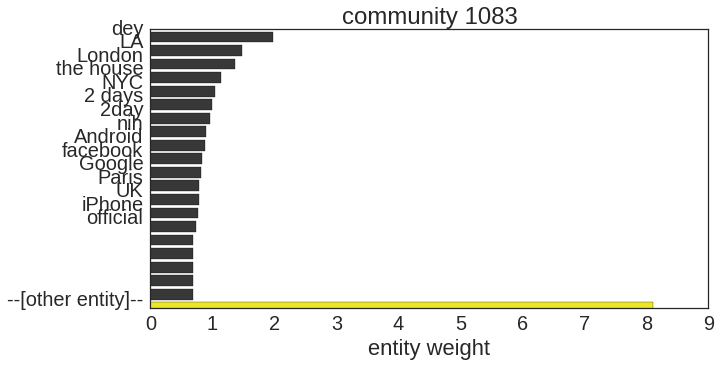

*** The user list 1490 ***
Analyzed 148 users out of total 27665 users 


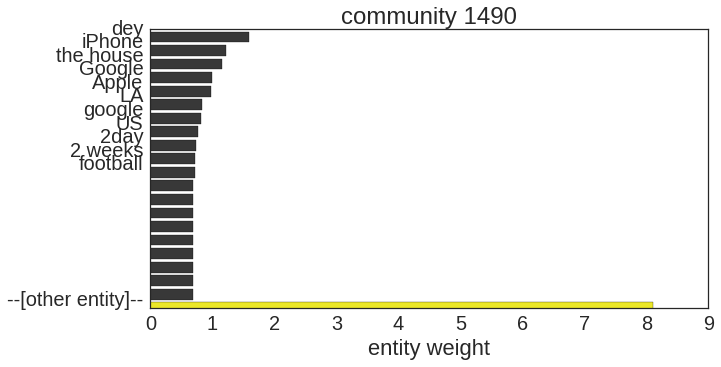

*** The user list 1593 ***
Analyzed 148 users out of total 27665 users 


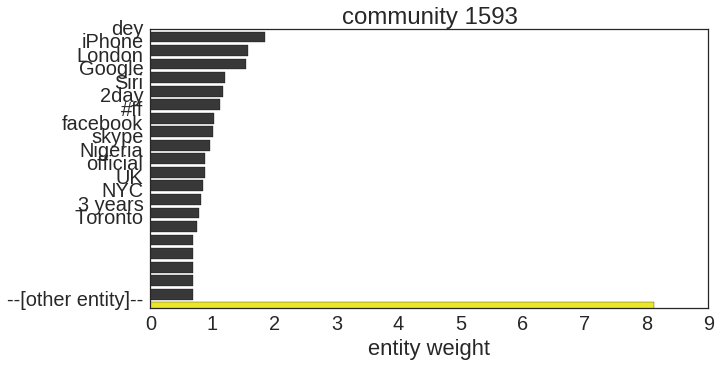

*** The user list 196 ***
Analyzed 146 users out of total 27665 users 


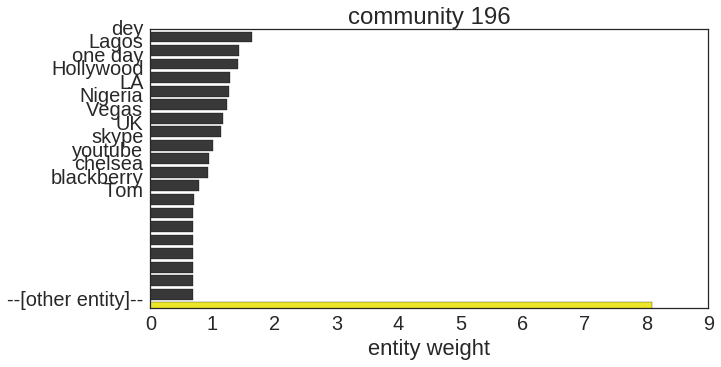

*** The user list 434 ***
Analyzed 142 users out of total 27665 users 


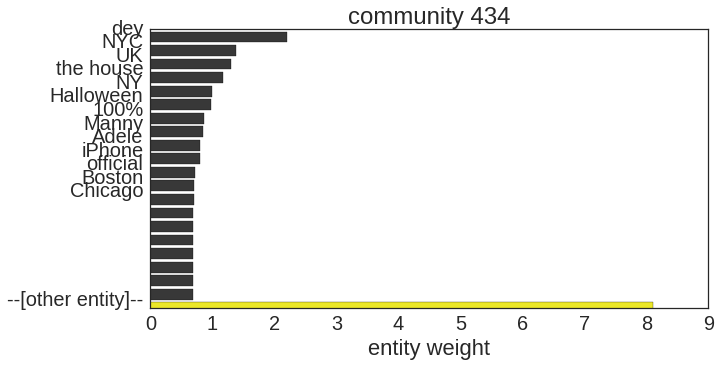

*** The user list 478 ***
Analyzed 147 users out of total 27665 users 


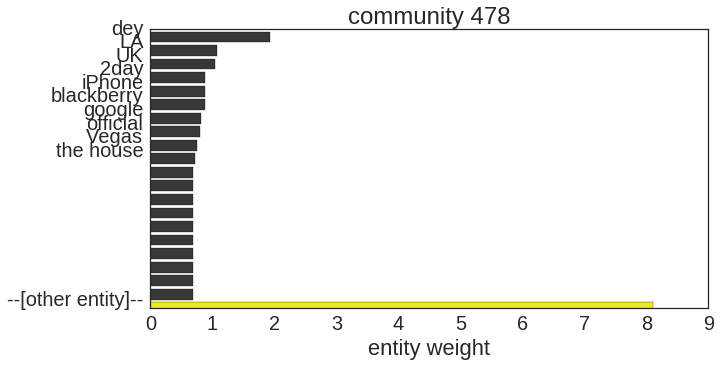

*** The user list 649 ***
Analyzed 145 users out of total 27665 users 


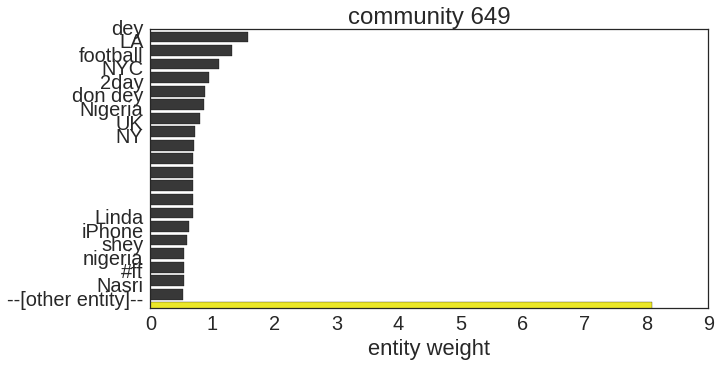

*** The user list 1043 ***
Analyzed 144 users out of total 27665 users 


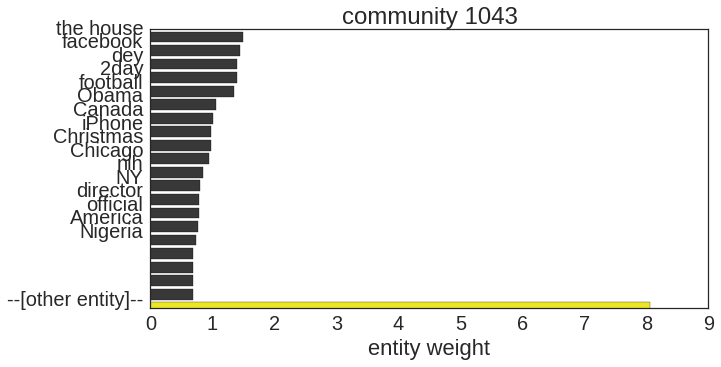

*** The user list 66 ***
Analyzed 146 users out of total 27665 users 


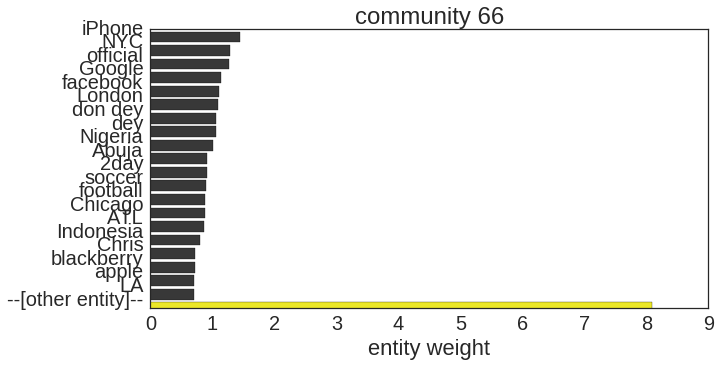

*** The user list 204 ***
Analyzed 146 users out of total 27665 users 


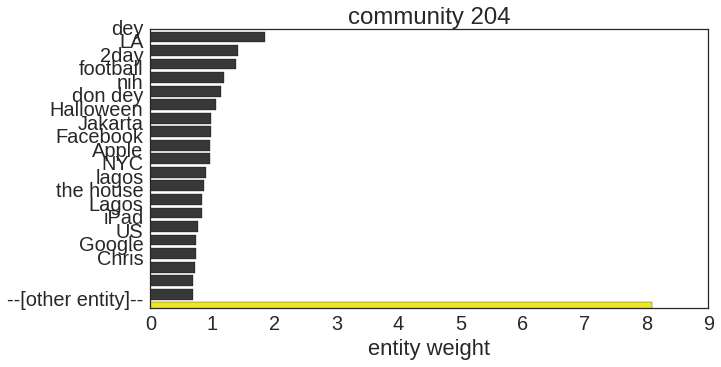

*** The user list 397 ***
Analyzed 143 users out of total 27665 users 


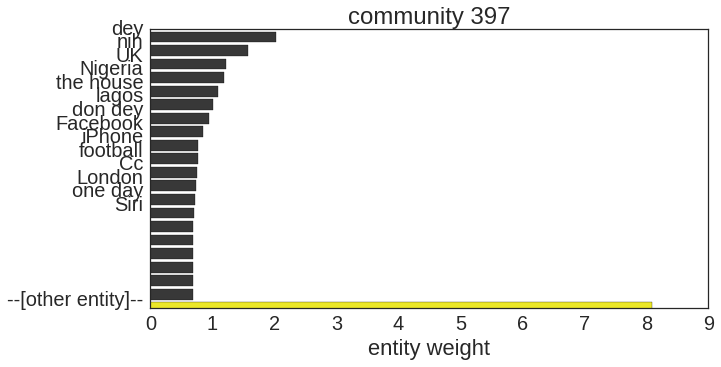

*** The user list 789 ***
Analyzed 145 users out of total 27665 users 


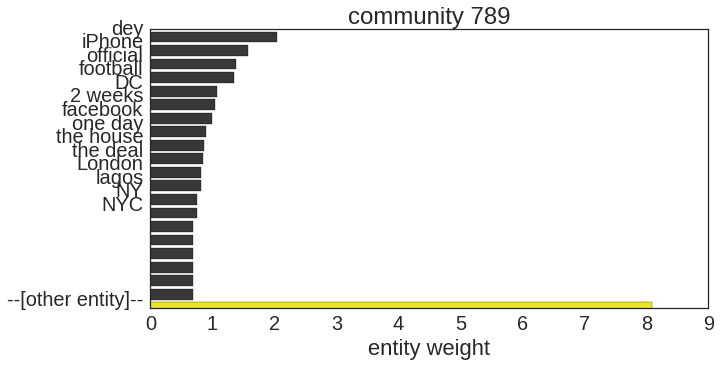

*** The user list 884 ***
Analyzed 145 users out of total 27665 users 


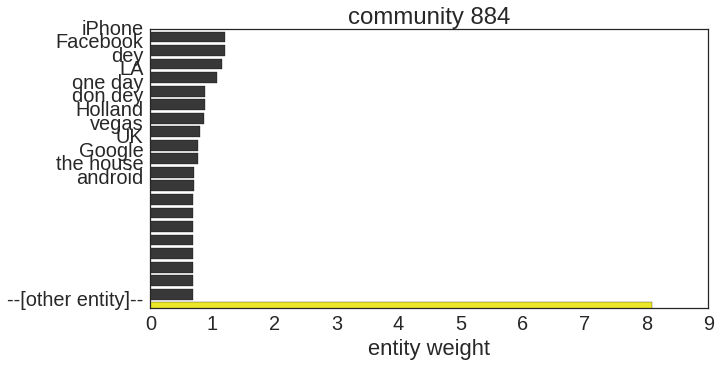

*** The user list 1122 ***
Analyzed 142 users out of total 27665 users 


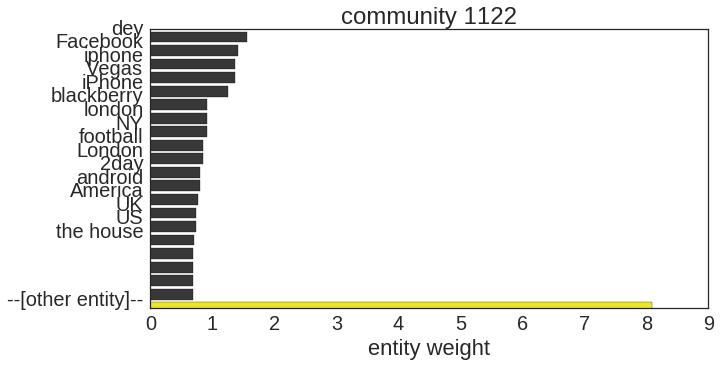

*** The user list 1315 ***
Analyzed 143 users out of total 27665 users 


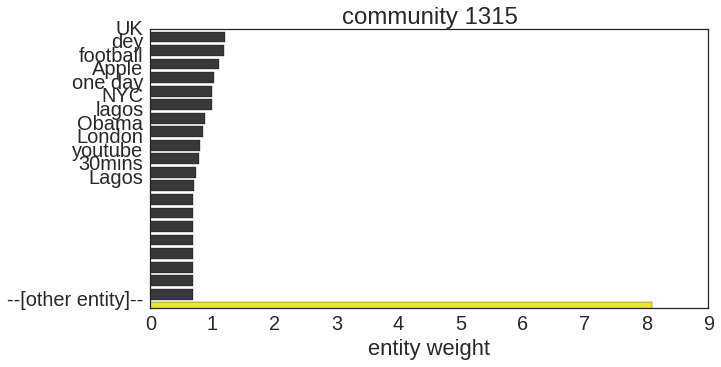

*** The user list 32 ***
Analyzed 145 users out of total 27665 users 


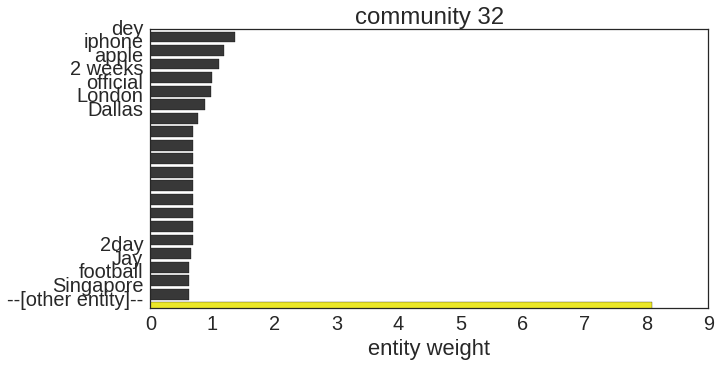

*** The user list 289 ***
Analyzed 143 users out of total 27665 users 


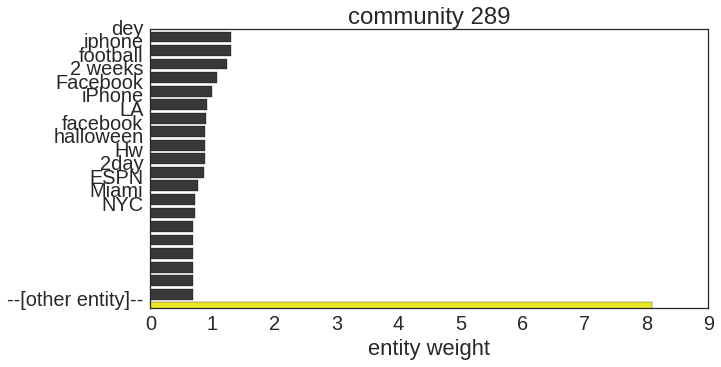

*** The user list 398 ***
Analyzed 144 users out of total 27665 users 


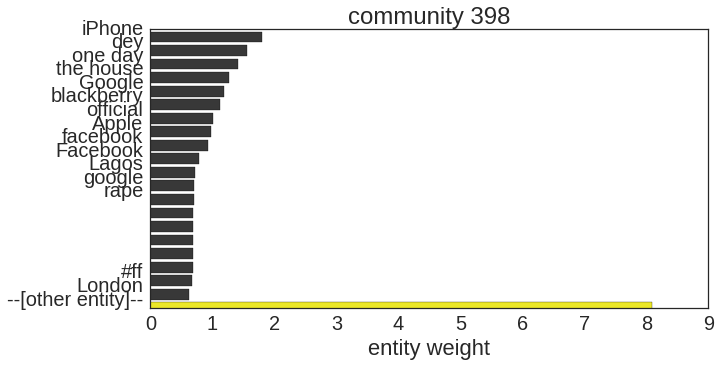

*** The user list 760 ***
Analyzed 142 users out of total 27665 users 


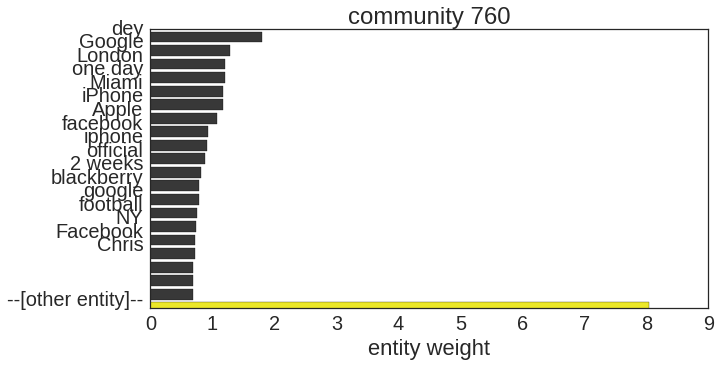

*** The user list 1056 ***
Analyzed 141 users out of total 27665 users 


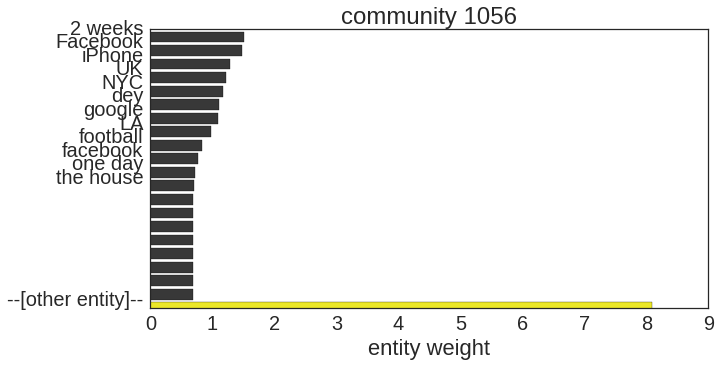

*** The user list 1403 ***
Analyzed 142 users out of total 27665 users 


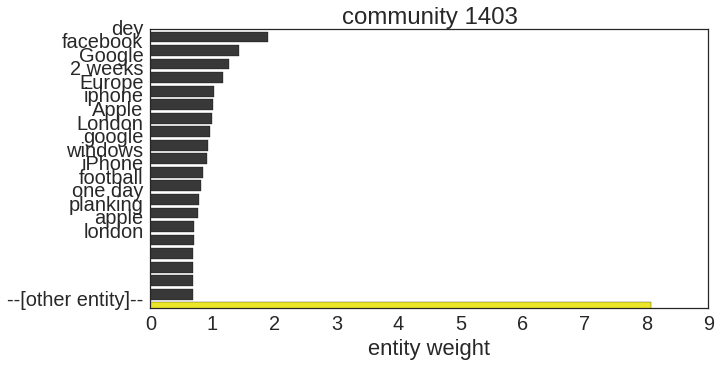

*** The user list 1507 ***
Analyzed 143 users out of total 27665 users 


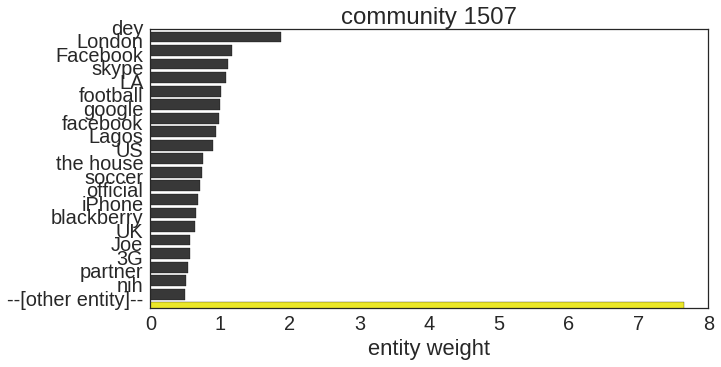

*** The user list 180 ***
Analyzed 140 users out of total 27665 users 


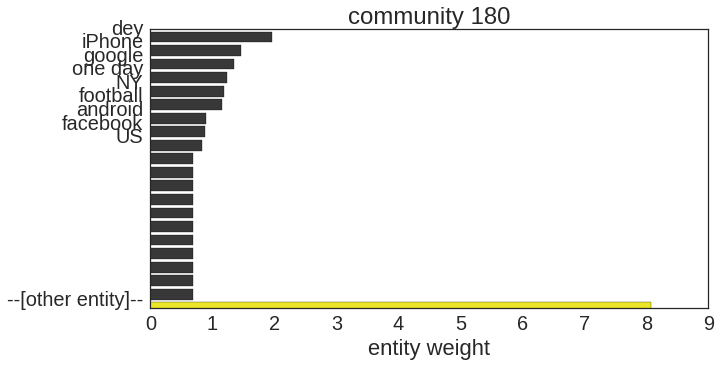

*** The user list 186 ***
Analyzed 144 users out of total 27665 users 


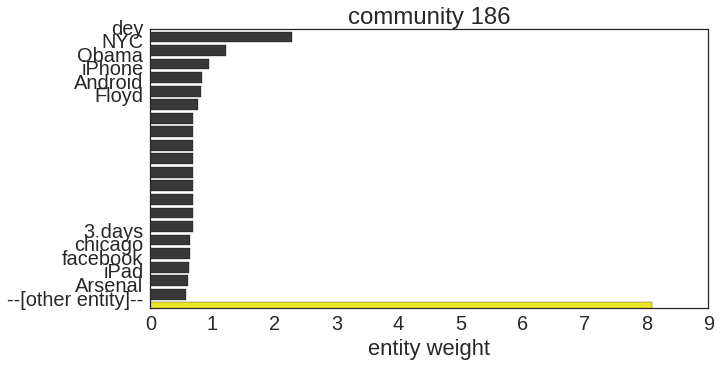

*** The user list 296 ***
Analyzed 142 users out of total 27665 users 


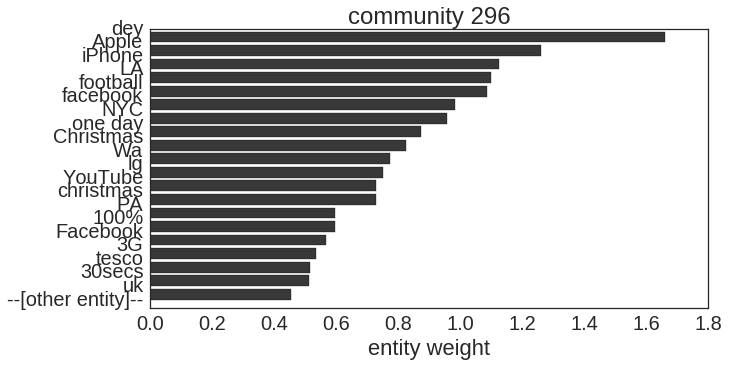

*** The user list 438 ***
Analyzed 143 users out of total 27665 users 


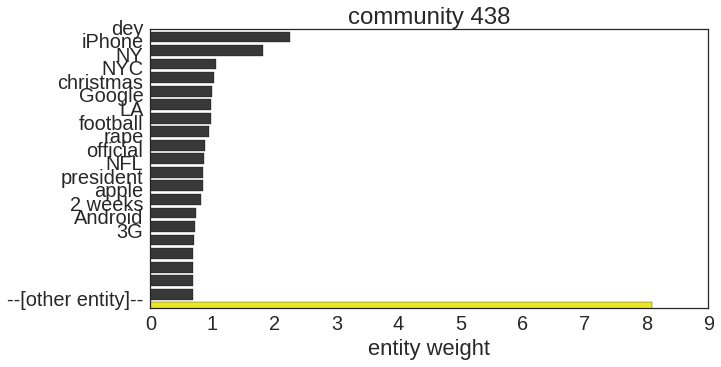

*** The user list 682 ***
Analyzed 140 users out of total 27665 users 


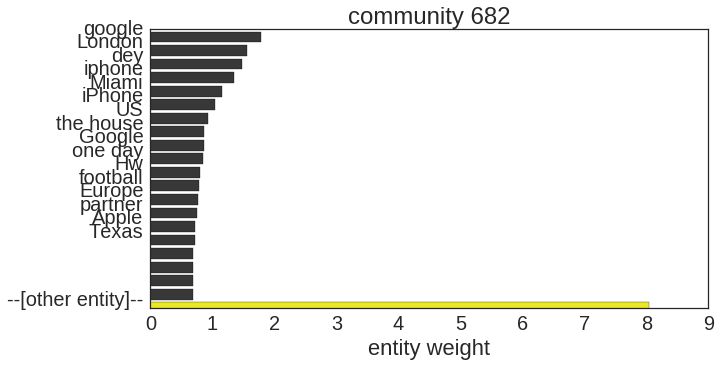

*** The user list 688 ***
Analyzed 139 users out of total 27665 users 


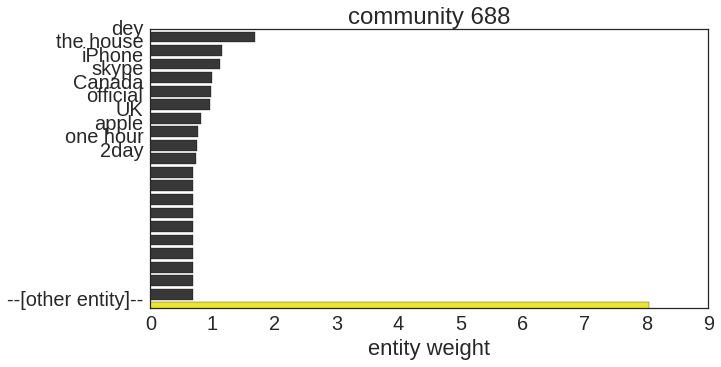

*** The user list 783 ***
Analyzed 143 users out of total 27665 users 


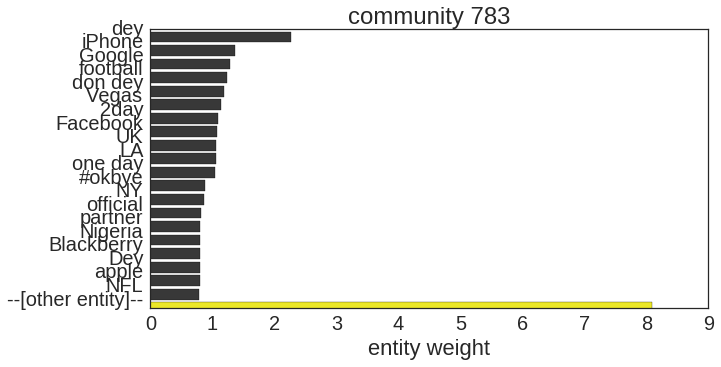

*** The user list 920 ***
Analyzed 141 users out of total 27665 users 


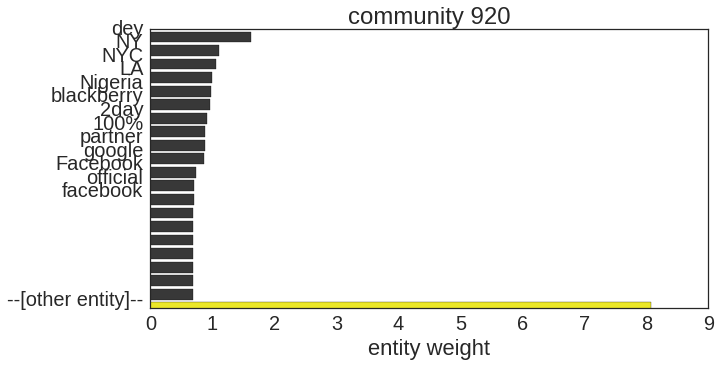

*** The user list 1017 ***
Analyzed 141 users out of total 27665 users 


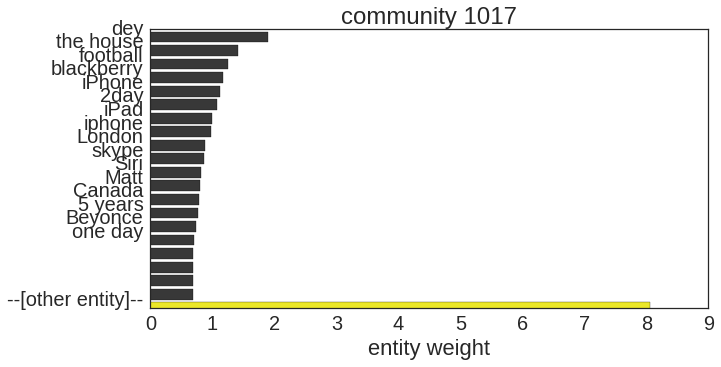

*** The user list 1193 ***
Analyzed 142 users out of total 27665 users 


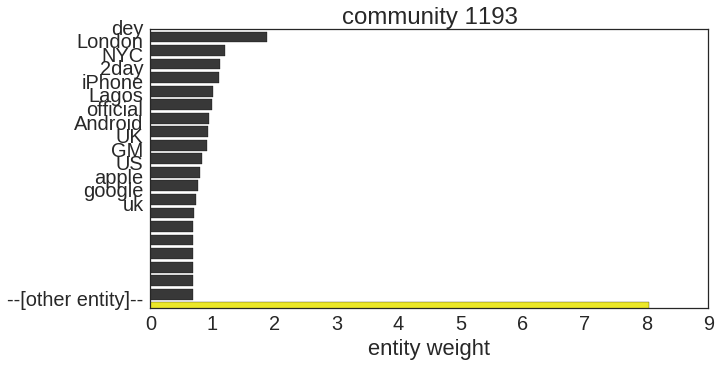

*** The user list 260 ***
Analyzed 141 users out of total 27665 users 


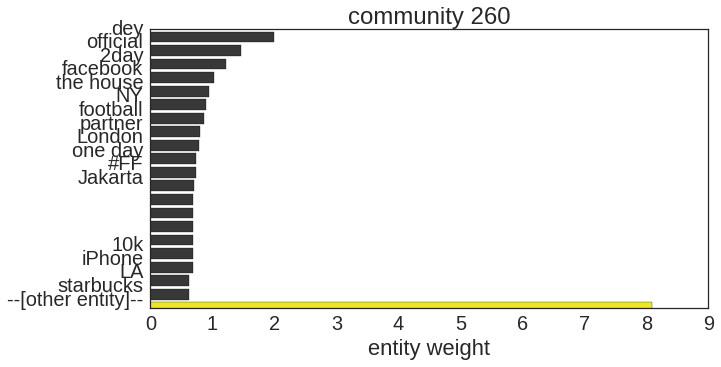

*** The user list 350 ***
Analyzed 141 users out of total 27665 users 


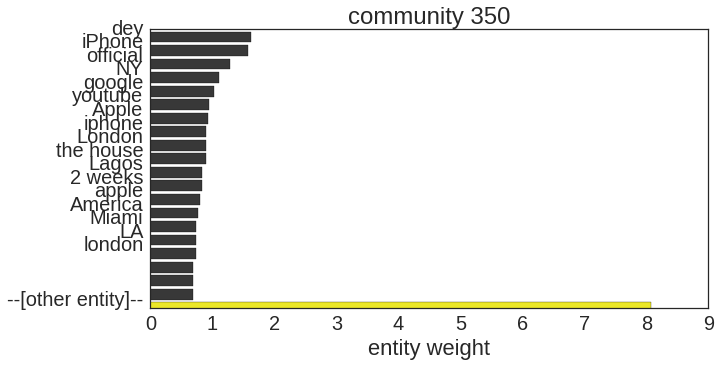

*** The user list 572 ***
Analyzed 143 users out of total 27665 users 


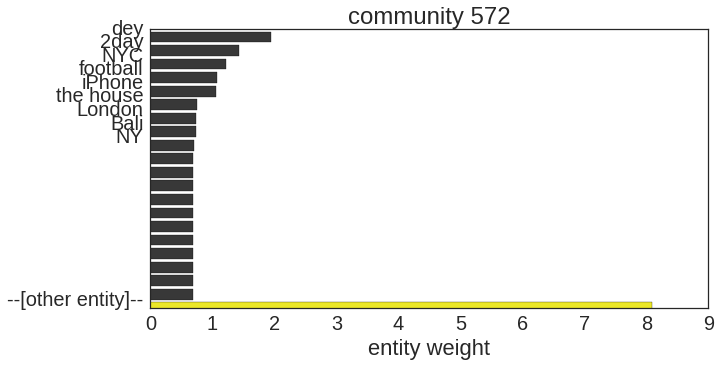

*** The user list 696 ***
Analyzed 142 users out of total 27665 users 


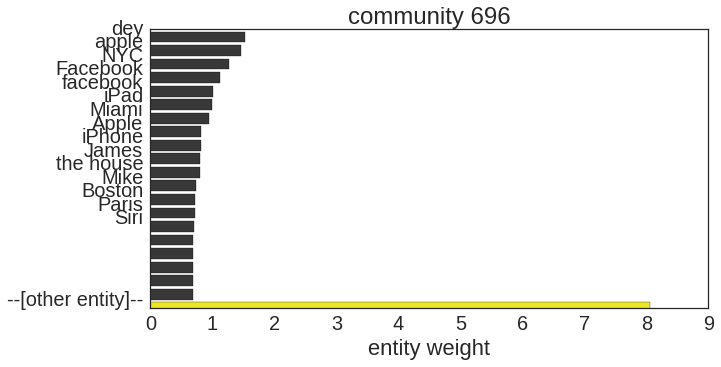

*** The user list 748 ***
Analyzed 137 users out of total 27665 users 


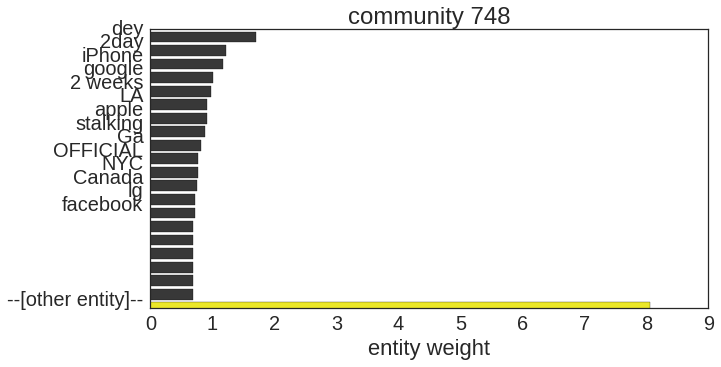

*** The user list 762 ***
Analyzed 138 users out of total 27665 users 


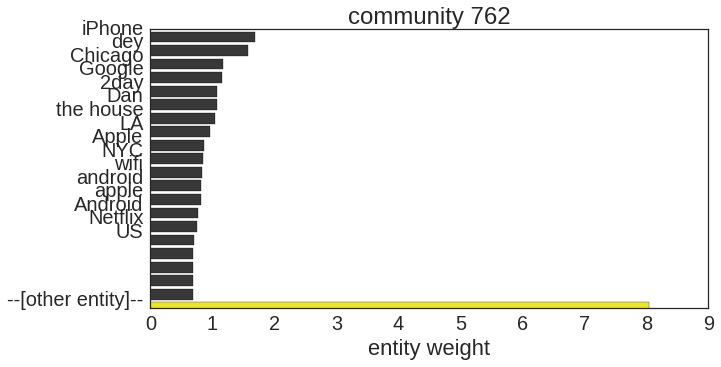

*** The user list 1002 ***
Analyzed 140 users out of total 27665 users 


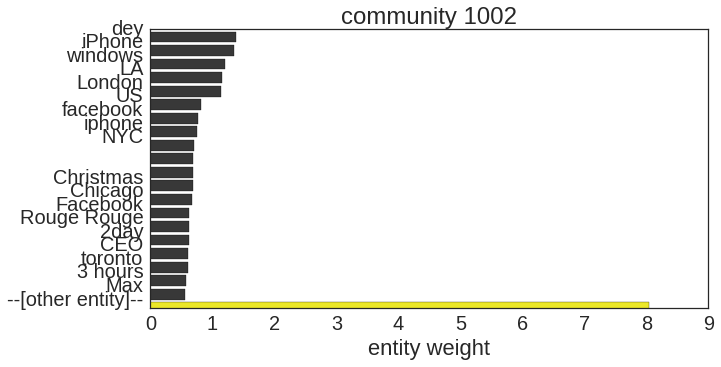

*** The user list 1071 ***
Analyzed 137 users out of total 27665 users 


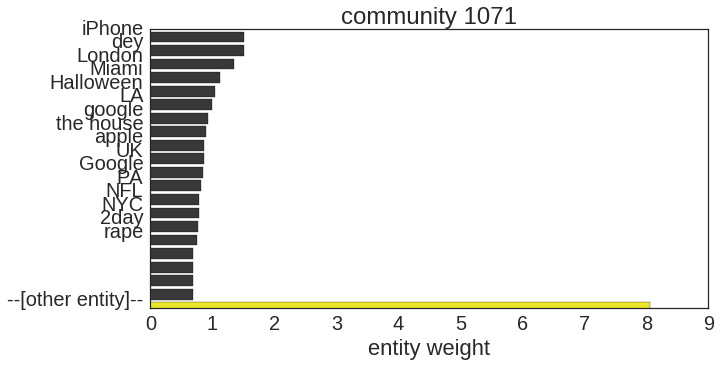

*** The user list 1144 ***
Analyzed 140 users out of total 27665 users 


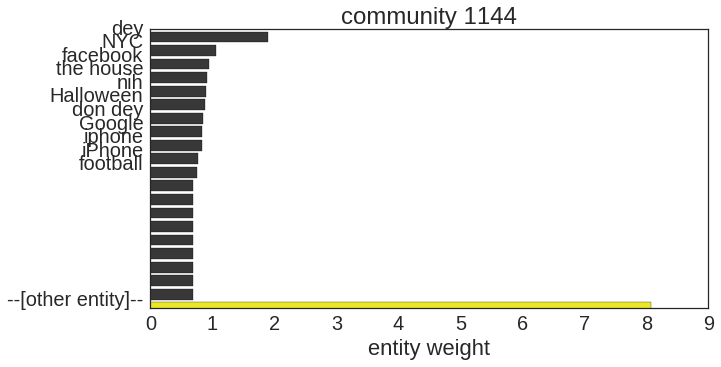

*** The user list 1148 ***
Analyzed 140 users out of total 27665 users 


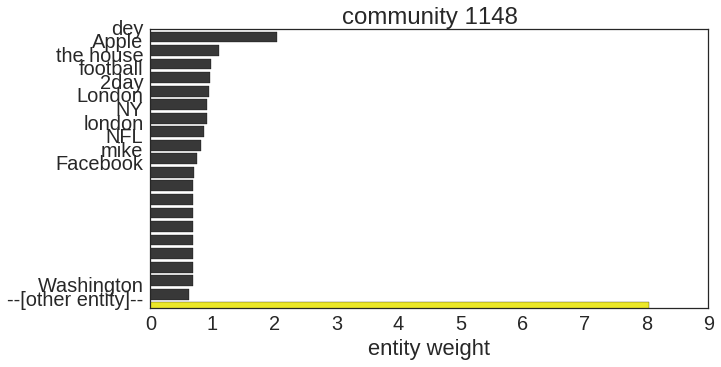

*** The user list 1167 ***
Analyzed 141 users out of total 27665 users 


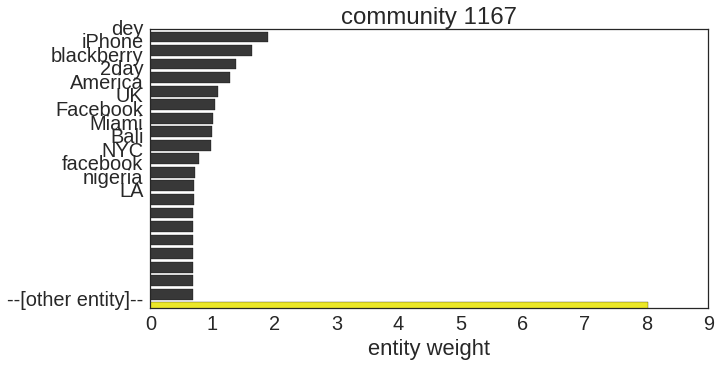

*** The user list 1474 ***
Analyzed 142 users out of total 27665 users 


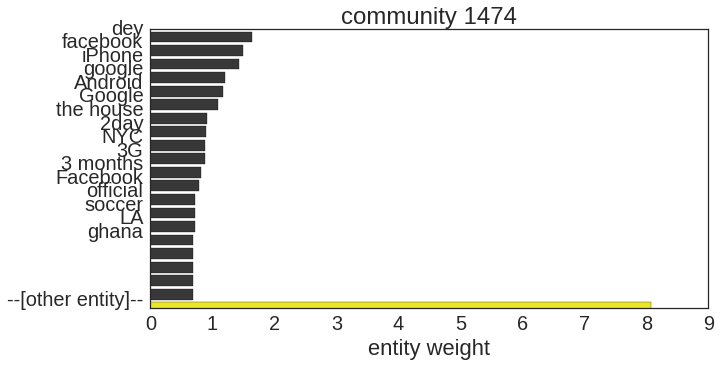

*** The user list 6 ***
Analyzed 138 users out of total 27665 users 


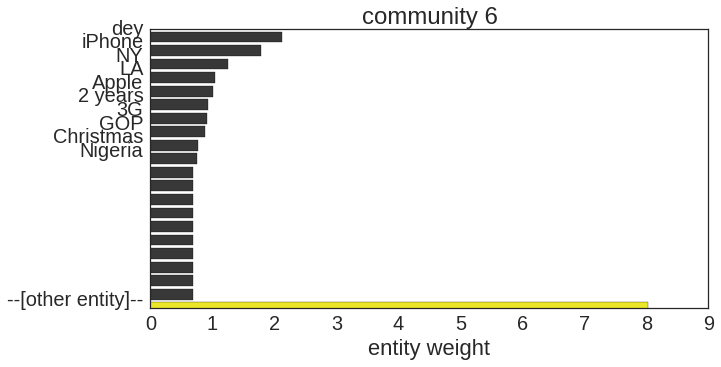

*** The user list 11 ***
Analyzed 140 users out of total 27665 users 


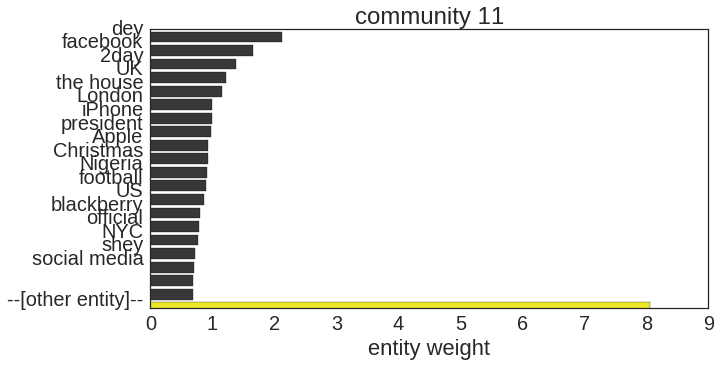

*** The user list 65 ***
Analyzed 136 users out of total 27665 users 


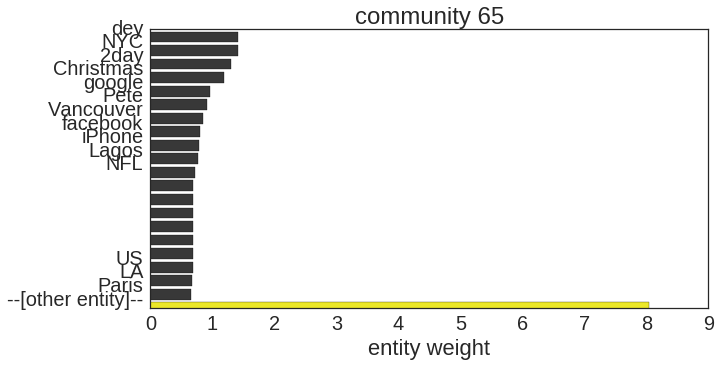

*** The user list 82 ***
Analyzed 137 users out of total 27665 users 


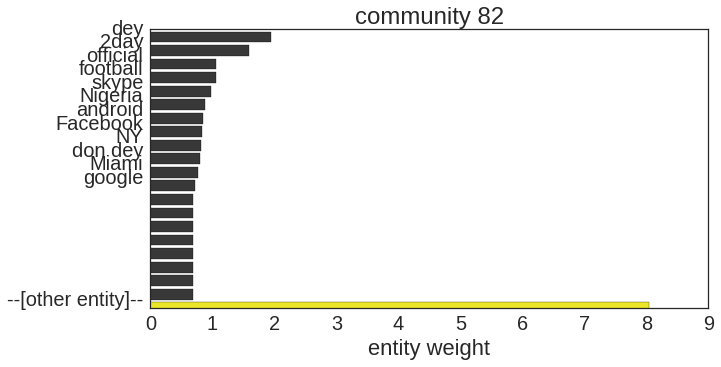

*** The user list 111 ***
Analyzed 138 users out of total 27665 users 


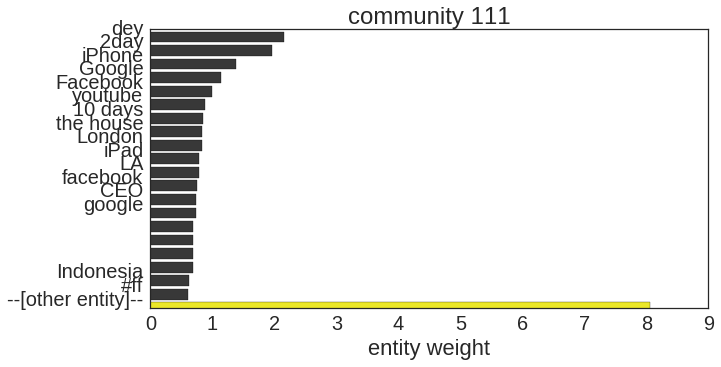

*** The user list 379 ***
Analyzed 140 users out of total 27665 users 


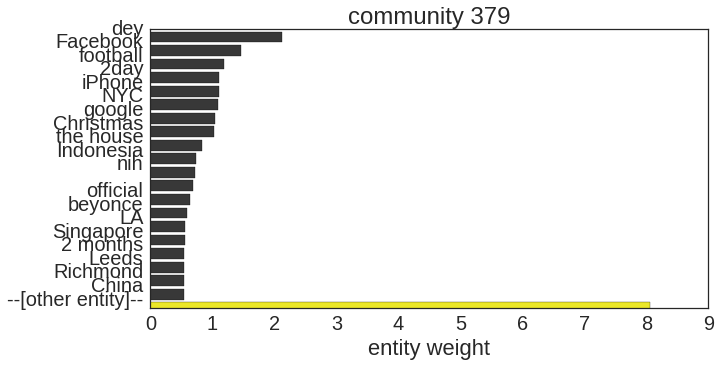

*** The user list 466 ***
Analyzed 137 users out of total 27665 users 


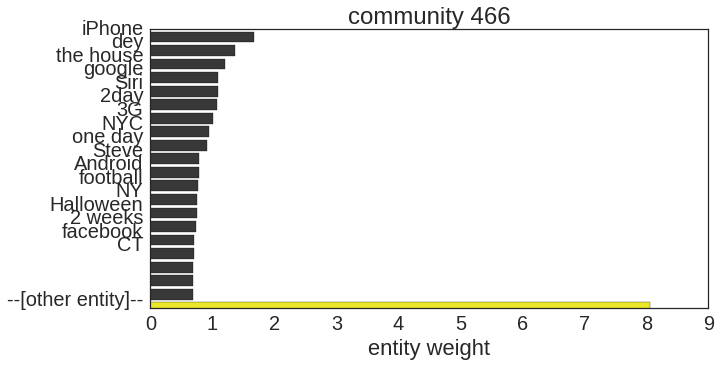

*** The user list 501 ***
Analyzed 136 users out of total 27665 users 


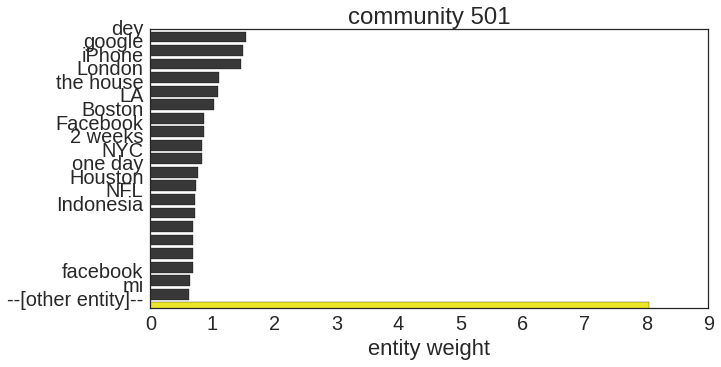

*** The user list 512 ***
Analyzed 138 users out of total 27665 users 


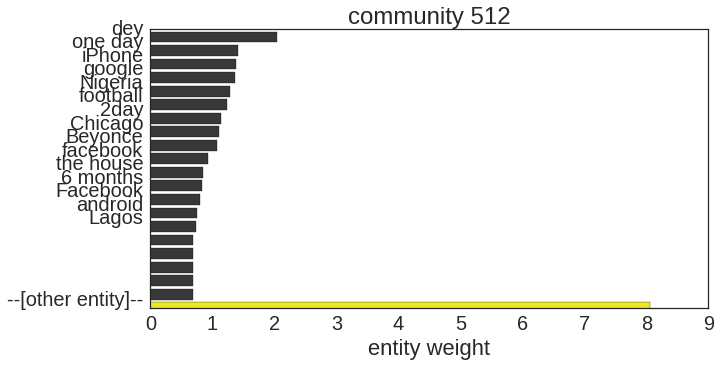

*** The user list 551 ***
Analyzed 140 users out of total 27665 users 


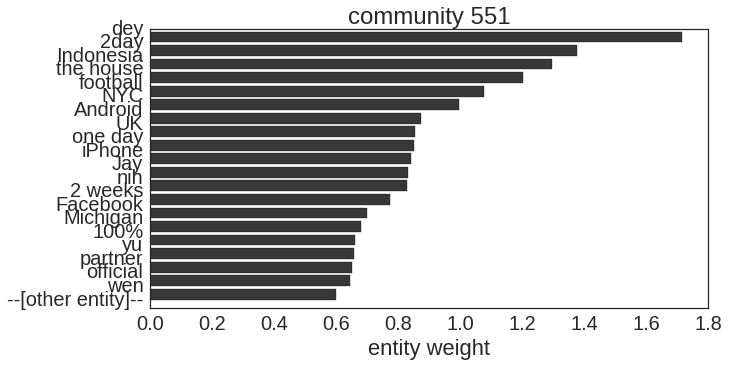

*** The user list 792 ***
Analyzed 140 users out of total 27665 users 


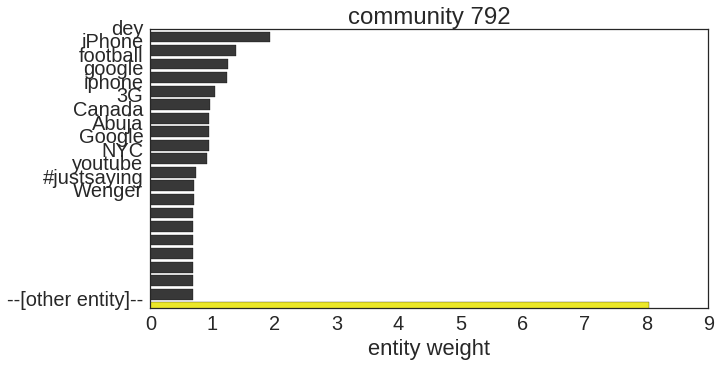

*** The user list 793 ***
Analyzed 139 users out of total 27665 users 


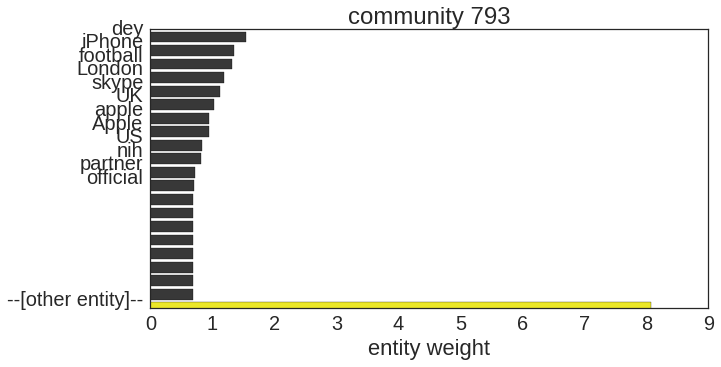

*** The user list 812 ***
Analyzed 140 users out of total 27665 users 


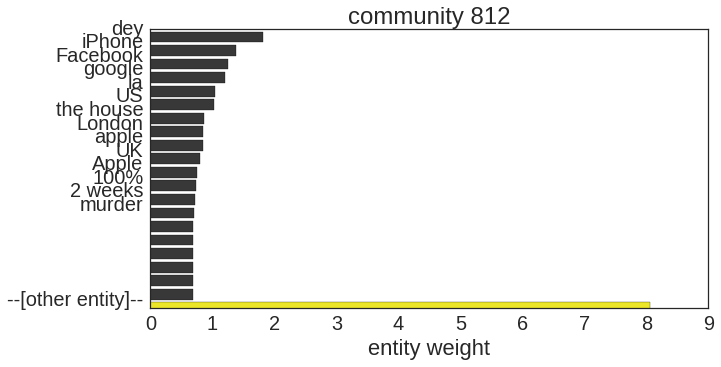

*** The user list 882 ***
Analyzed 138 users out of total 27665 users 


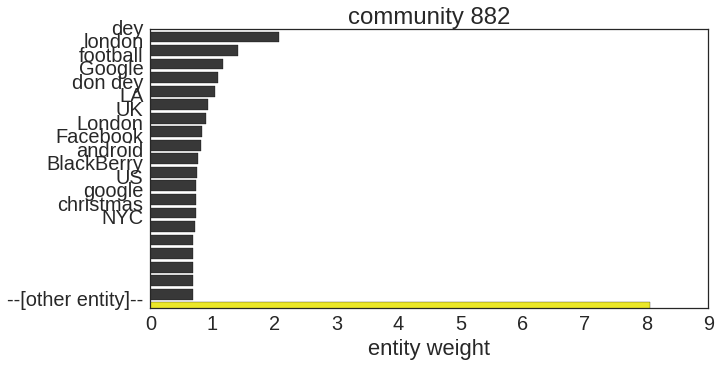

*** The user list 899 ***
Analyzed 141 users out of total 27665 users 


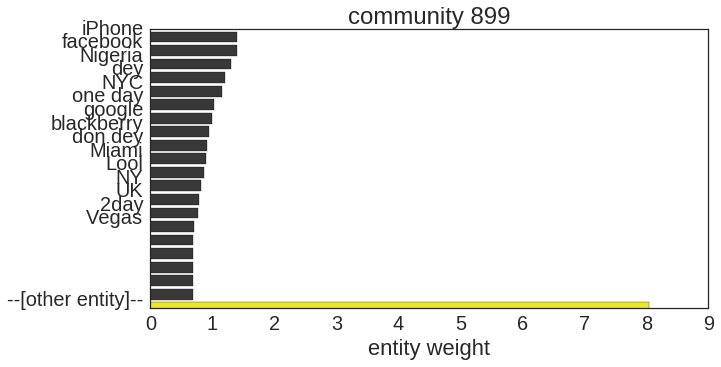

*** The user list 1184 ***
Analyzed 140 users out of total 27665 users 


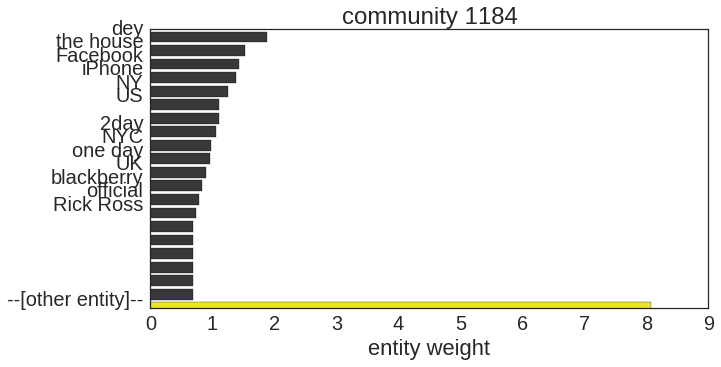

*** The user list 1322 ***
Analyzed 140 users out of total 27665 users 


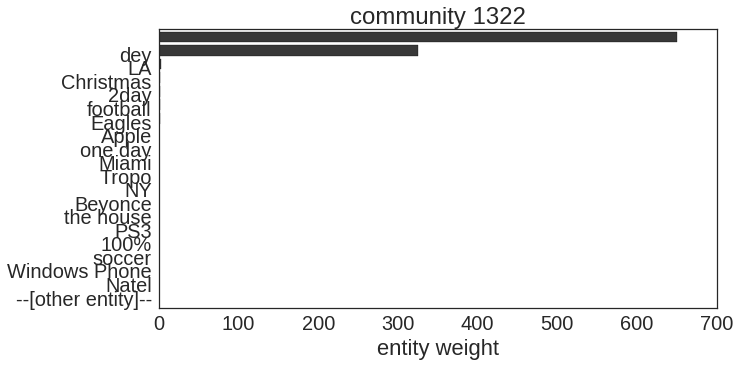

*** The user list 1335 ***
Analyzed 140 users out of total 27665 users 


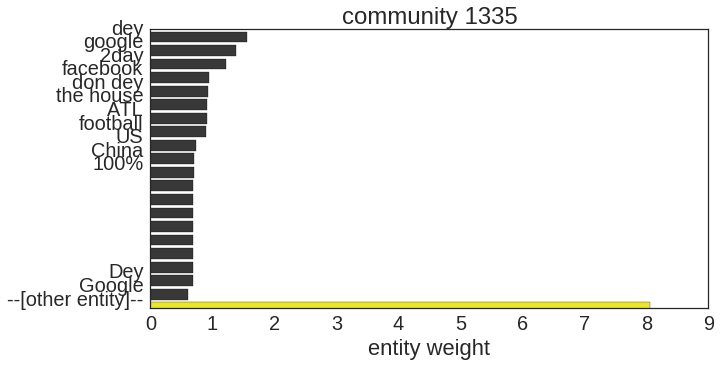

*** The user list 1352 ***
Analyzed 139 users out of total 27665 users 


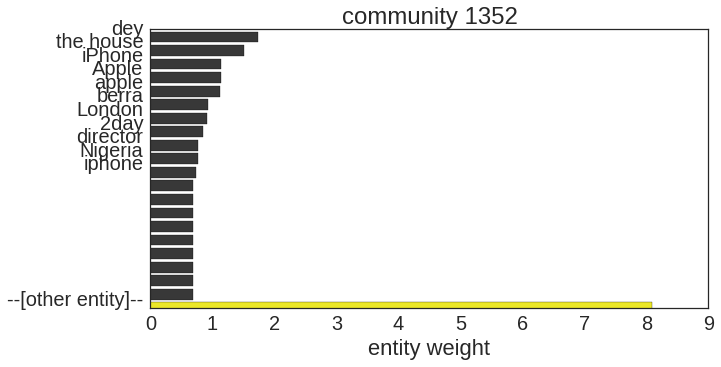

*** The user list 1389 ***
Analyzed 139 users out of total 27665 users 


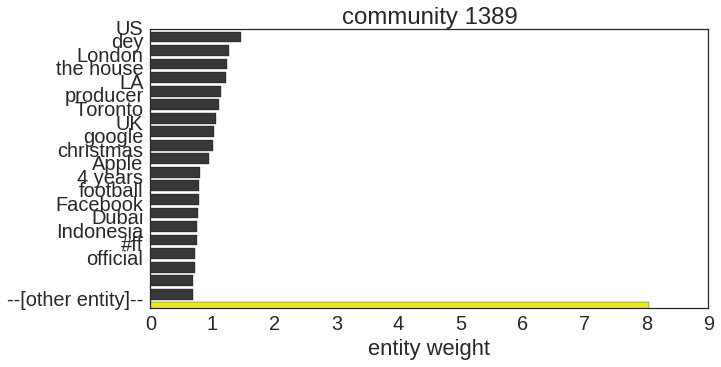

*** The user list 1416 ***
Analyzed 142 users out of total 27665 users 


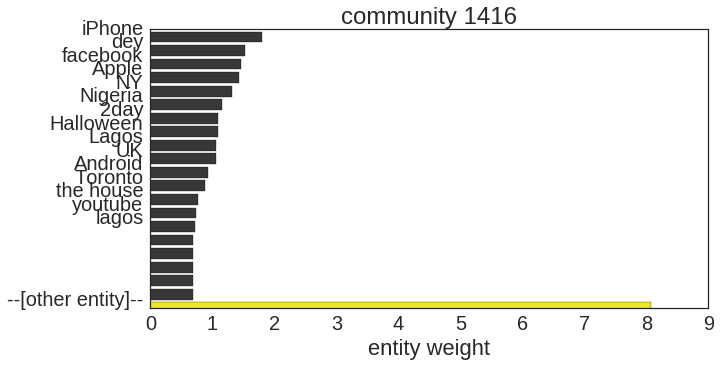

*** The user list 1488 ***
Analyzed 138 users out of total 27665 users 


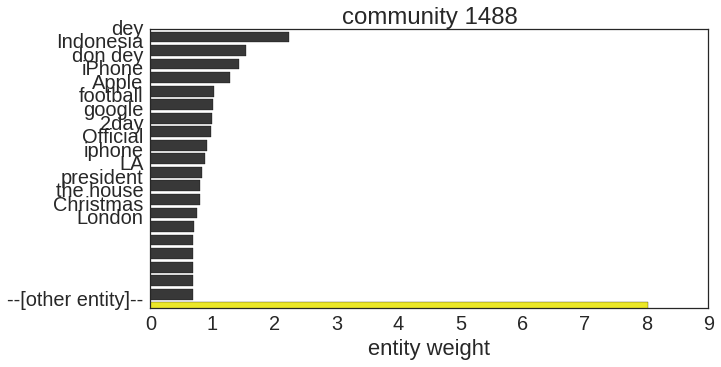

*** The user list 1518 ***
Analyzed 140 users out of total 27665 users 


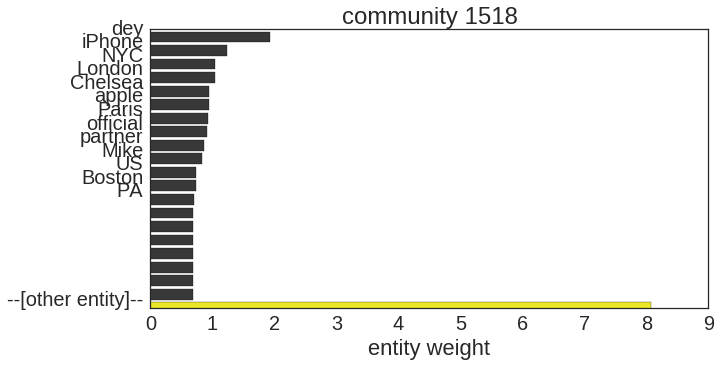

*** The user list 1536 ***
Analyzed 137 users out of total 27665 users 


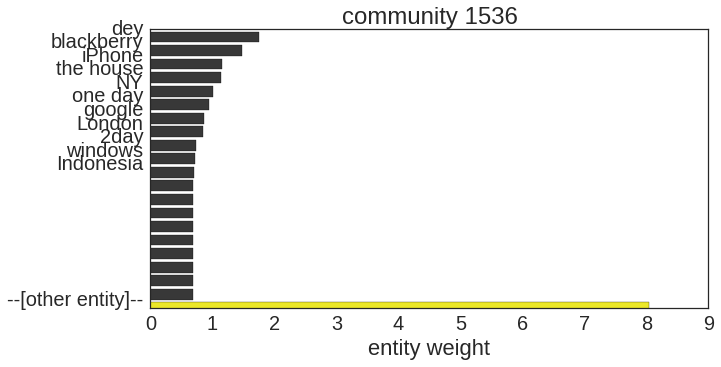

*** The user list 1543 ***
Analyzed 142 users out of total 27665 users 


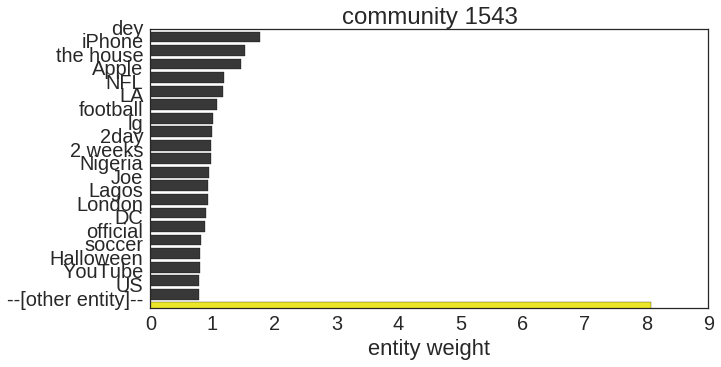

*** The user list 5 ***
Analyzed 140 users out of total 27665 users 


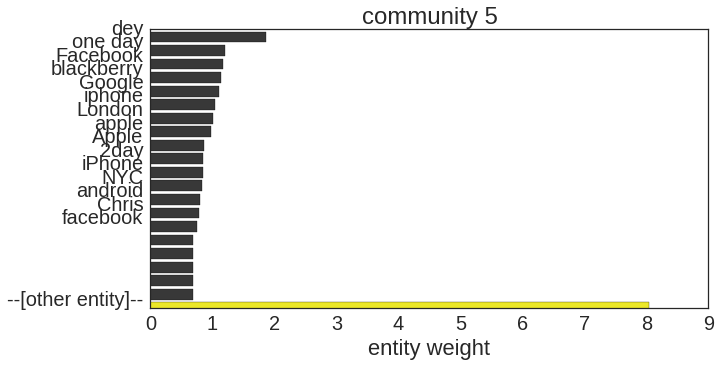

*** The user list 64 ***
Analyzed 140 users out of total 27665 users 


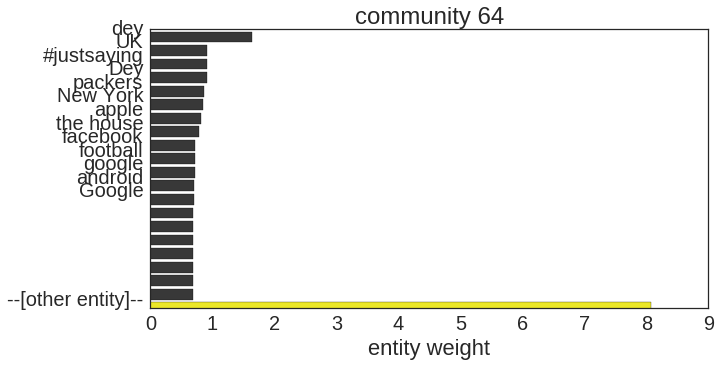

*** The user list 157 ***
Analyzed 139 users out of total 27665 users 


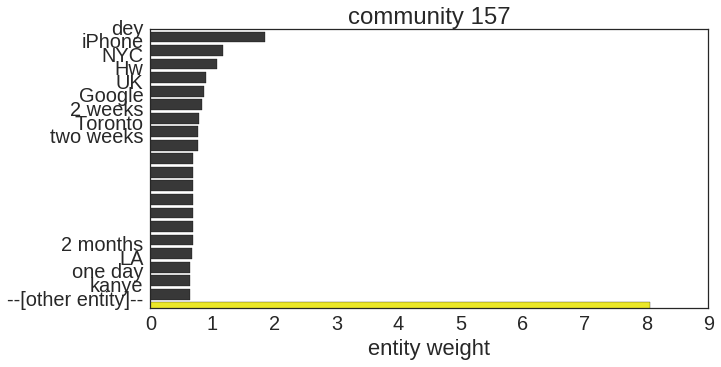

*** The user list 277 ***
Analyzed 139 users out of total 27665 users 


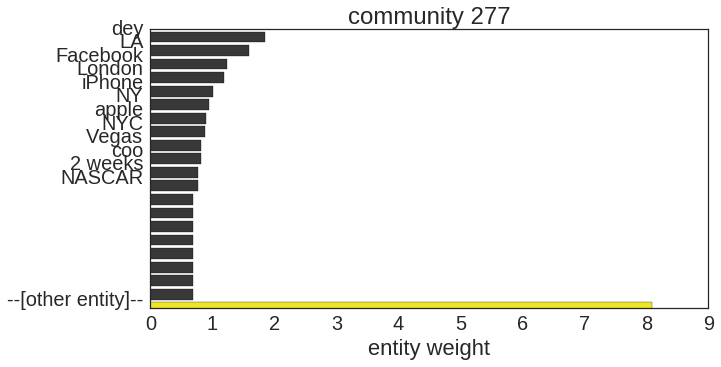

*** The user list 548 ***
Analyzed 137 users out of total 27665 users 


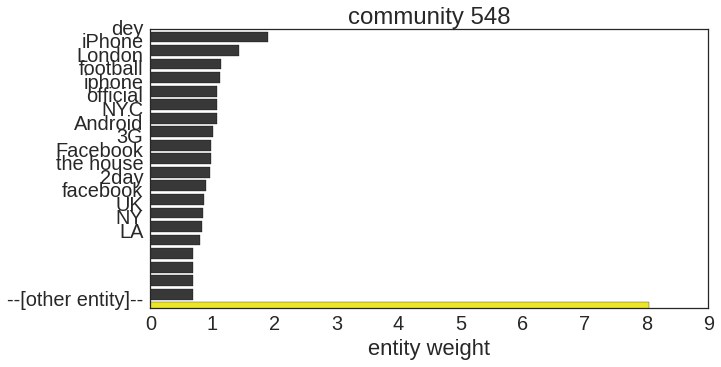

*** The user list 668 ***
Analyzed 137 users out of total 27665 users 


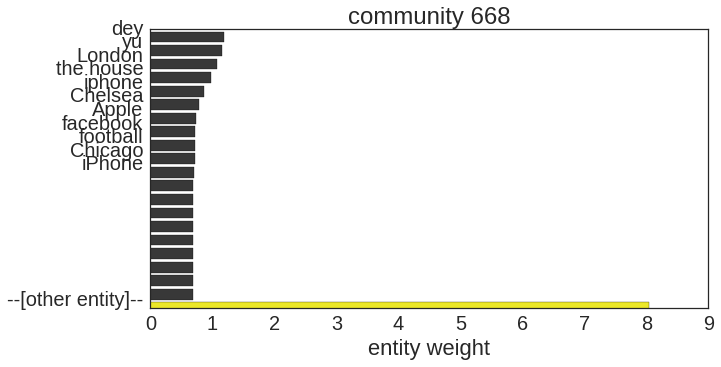

*** The user list 777 ***
Analyzed 140 users out of total 27665 users 


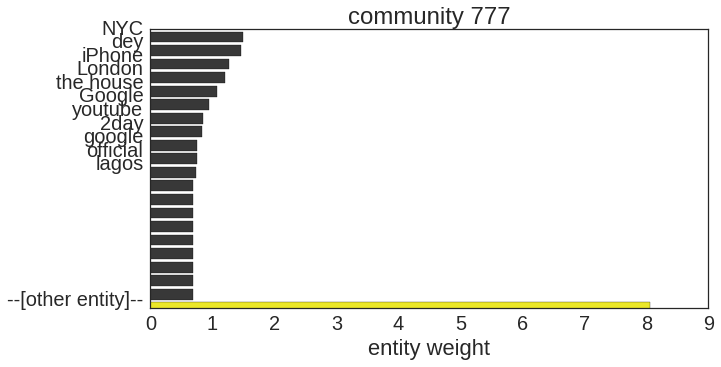

*** The user list 841 ***
Analyzed 138 users out of total 27665 users 


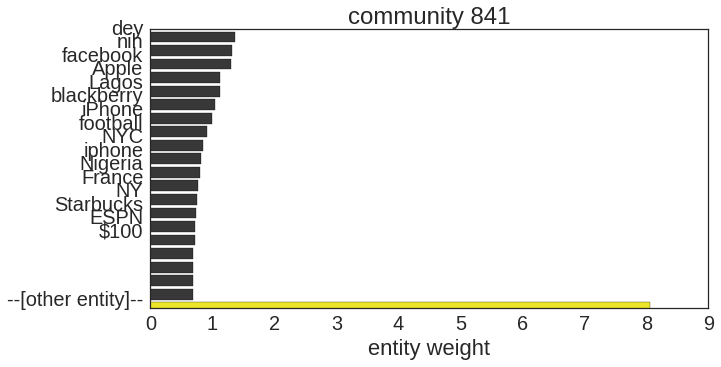

*** The user list 852 ***
Analyzed 140 users out of total 27665 users 


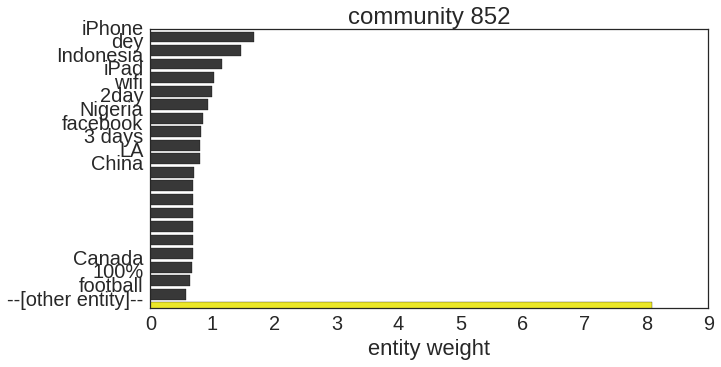

*** The user list 1139 ***
Analyzed 138 users out of total 27665 users 


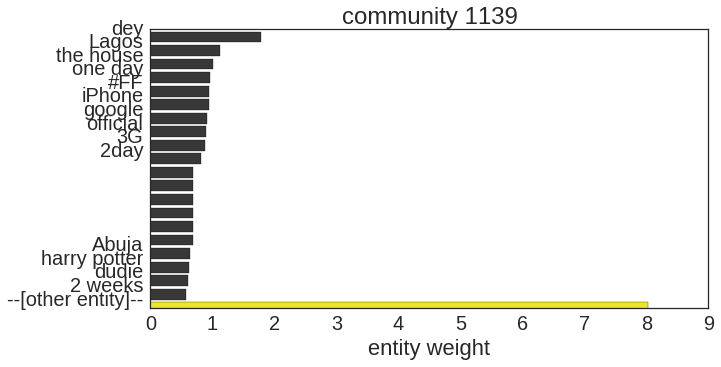

*** The user list 1249 ***
Analyzed 137 users out of total 27665 users 


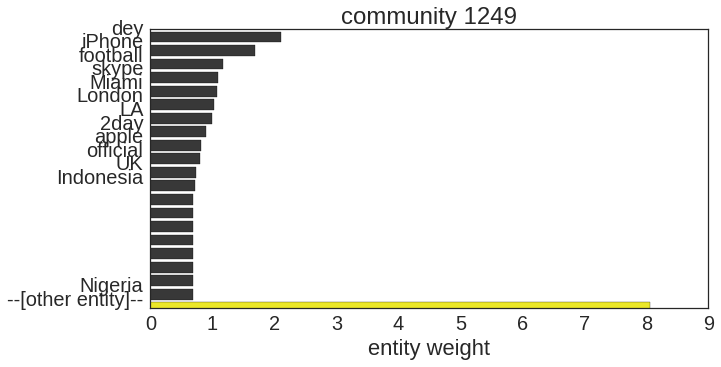

*** The user list 1377 ***
Analyzed 139 users out of total 27665 users 


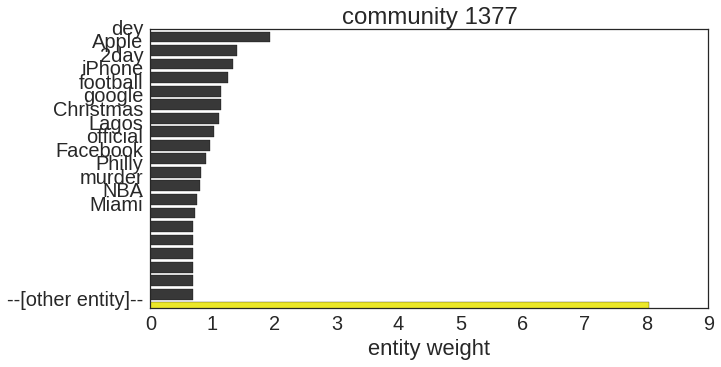

*** The user list 1398 ***
Analyzed 137 users out of total 27665 users 


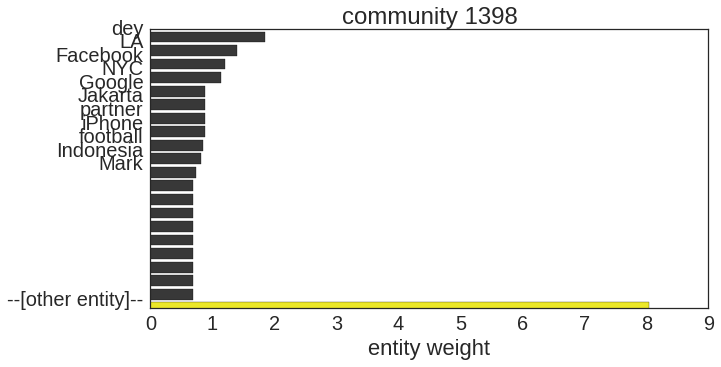

*** The user list 1463 ***
Analyzed 137 users out of total 27665 users 


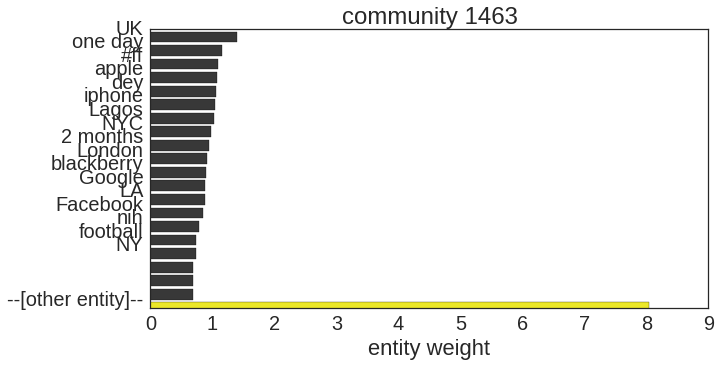

*** The user list 1505 ***
Analyzed 137 users out of total 27665 users 


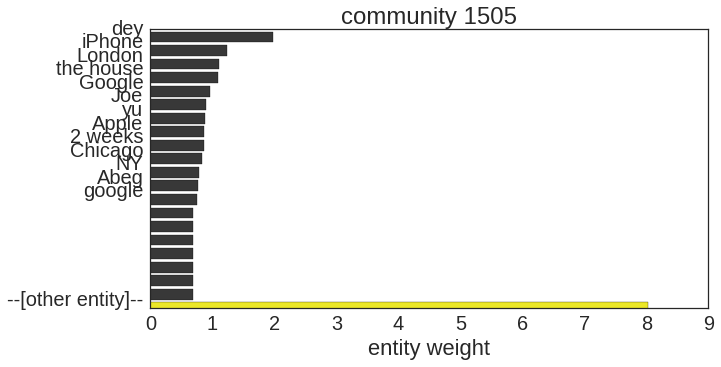

*** The user list 1551 ***
Analyzed 140 users out of total 27665 users 


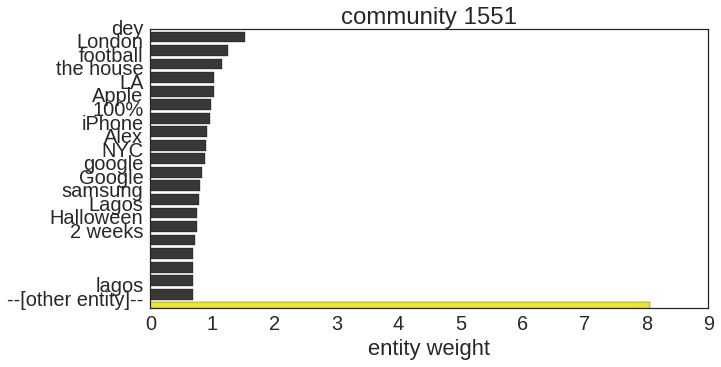

In [143]:
main(sizeN=140)